# G-Tube Project

In [1]:
import pandas as pd
import numpy as np
import glob
import re
import matplotlib.pyplot as plt
import warnings
import seaborn as sns
from itertools import cycle
warnings.filterwarnings('ignore')

%matplotlib inline

## Background

Premature infants undergo G-Tube Surgery. Data was collected for around 24 hours before and 24 hours after (not exact). This data was collected using NIRS which interfaced with the Moberg Machine. The first NIRS probe is placed on the infant's brain and the second probe is placed in the flank for renal StO2. 

EEG leads done by nurses. Pause monitoring for transport period. Stopped right before transport, restarted as soon as baby gets put onto the table.
Pauses (max 20 mins).

For this project, since there is no specific hypothesis, data will be visualized and exploratory data analysis will be used to better inform further analysis.

## Data Preparation and Cleaning

Data was downloaded from a private Google Drive server and file names were de-identified with this naming scheme: GTP001, GTP002, etc. Each file is concatenated into one dataframe for easier analysis.
Only relevant data was filtered out from the raw dataset to form the analysis dataframe. FTOE was calcualted from SpO2 and StO2.

## Data Features

|Feature Name   | Description   | Variable Type   |  Unit|
|---|---|---|---|
|Subject   | ID of Subject  | label  | none |
|HR   | Heart Rate  | quantitative  | beats per min |
|RR   | Respiratory Rate  | quantitative  | breaths per min |
|SpO2   | Peripheral Oxygen Saturation   | quantitative  | % Oxygen |
|MAP   | Mean Arterial Pressure  | quantitative  | mm Hg|
|cStO2   | Local tissue oxygenation - left brain  | quantitative  | % StO2 | 
|rStO2   | Local tissue oxygenation - renal (flank area)  | quantitative  | % StO2 |
|ratioStO2 | Ratio of rStO2/cStO2 | quantitative | ratio
|cFTOE   | Fractional tissue oxygenation extraction - brain  | quantitative  | % FTOE |
|rFTOE   | Fractional tissue oxygenation extraction - renal  | quantitative  | % FTOE |
|Annotation   | Patient notes  | label  | string |

In [2]:
files_lst= glob.glob(r'C:\Users\jctan\Documents\G-Tube Project\raws\*.xlsx', recursive=True) # Output 1

In [3]:
df_lst = []

In [4]:
for f in files_lst:
    # load file
    
    df = pd.read_excel(f)

    # Assign ID and Minutes
    df['Subject'] = re.search(r'GTP(.*?).xlsx', f).group(1)[1:3]# .lstrip("0")
    df['Minutes'] = np.arange(1,len(df)+1)

    # EEG
    try:
        df['C3-P3'] = df['ADR,C3-P3,Numeric,Float,Amp1020,ADR_DL=0.5,ADR_DH=3.5,ADR_AL=8,ADR_AH=12.5:Mean']
        df['C4-P4'] = df['ADR,C4-P4,Numeric,Float,Amp1020,ADR_DL=0.5,ADR_DH=3.5,ADR_AL=8,ADR_AH=12.5:Mean']
    except:
        print(f, ' ECG Error')
        df['C3-P3'] = np.NaN
        df['C4-P4'] = np.NaN

    # Vitals
    df['HR'] = df['HR,na,Numeric,Float,IntelliVue (bpm):Mean']
    df['RR'] = df['RR,na,Numeric,Float,IntelliVue (BPM):Mean']
    df['SpO2'] = df['SpO2,na,Numeric,Float,IntelliVue (%):Mean']
    df['MAP'] = df['NBP,Mean,Numeric,Float,IntelliVue (mmHg):Mean']

    # NIRS
    df['cStO2'] = df[df.columns[df.columns.str.startswith('StO2,1') & df.columns.str.endswith('Mean')]]
    df['rStO2'] = df[df.columns[df.columns.str.startswith('StO2,2') & df.columns.str.endswith('Mean')]]
    
    df['ratioStO2'] = (df['rStO2']/df['cStO2'])

    df['cFTOE'] = (df['SpO2'] - df['cStO2']) / df['SpO2'] * 100 # (SpO2 - StO2) / SpO2
    df['rFTOE'] = (df['SpO2'] - df['rStO2']) / df['SpO2'] * 100

    df['Annotation'] = df.filter(regex='Notes')
    df_lst.append(df)

C:\Users\jctan\Documents\G-Tube Project\raws\GTP011.xlsx  ECG Error


In [5]:
dff = pd.concat(df_lst, ignore_index=True, sort=True)

## Data Subsetting

For now, remove all EEG data. Focus on one hour around time = 0 which for now will be "prepping"

In [6]:
varlst = ['Subject', 'HR', 'RR', 'SpO2', 'MAP', 'C3-P3', 'C4-P4', 'cStO2', 'rStO2', 'ratioStO2', 'cFTOE', 'rFTOE', 'Annotation']

data = dff[varlst] 

In [7]:
# data.index = dff['Subject']

In [8]:
data.groupby('Subject').count()['Annotation'].sort_values(ascending=True)

Subject
05    37
07    38
11    39
04    44
08    47
10    49
09    50
02    68
01    74
03    75
06    87
Name: Annotation, dtype: int64

### List all annotations available in dataset

In [9]:
print(data.groupby(["Subject", "Annotation"]).size().to_string())

Subject  Annotation                                                 
01       Vitals, diaper change repositioned                              1
         alburetol treatment                                             1
         baby place on OR table                                          1
         bagging no extubation                                           1
         blood pressure                                                  1
         bovie                                                           1
         closing                                                         1
         closing belly button                                            1
         closing belly button, end laparoscopy                           1
         de sat to 85, stimulated, repositioned                          1
         desufflation, gas off                                           1
         diaper change                                                   3
         diaper change, suction

### Stratify data by time periods

In [10]:
def gibi(annotation, ID): # Get Index By ID
    all_id = data.loc[data['Annotation'] == annotation]
    index_val = all_id.loc[all_id['Subject'] == ID].index[0] # returns only specific id
    return index_val

In [11]:
# Split up the data into 60 mins before, during, and 60 mins after procedure

index_dct = {}
time_dct = {}

Subject_lst = data['Subject'].unique()

def get_relevant_times(data):
      
    for i in Subject_lst:
        
        # match to key in Annotation
        pp = gibi('paused pre-op', i)
        ps = gibi('procedure start', i)
        pe = gibi('procedure end', i)
        rp = gibi('resume post-op', i)
        
        before_tp = cycle(range(0, len(data[pp-60:pp].index))) # 0 to 60
        during_tp = cycle(range(len(data[pp-60:pp].index), len(data[pp-60:pp].index)+len(data[ps:pe].index))) # 60 to variable end
        after_tp = cycle(range(len(data[pp-60:pp].index)+len(data[ps:pe].index), len(data[pp-60:pp].index)+len(data[ps:pe].index)+len(data[rp:rp+60].index)))
        
        for j in data[pp-60:pp].index:
            index_dct[j] = 'Before'
            time_dct[j] = next(before_tp)
        for j in data[ps:pe].index:
            index_dct[j] = 'During'
            time_dct[j] = next(during_tp)
        for j in data[rp:rp+60].index:
            index_dct[j] = 'After'
            time_dct[j] = next(after_tp)
        
    return


In [12]:
get_relevant_times(data)
data['Group'] = data.index.map(index_dct) # Map Groups to index
data['Time'] = data.index.map(time_dct) # Map Time to index

In [13]:
# Function to display tables side-by-side
# Not working in JupyterLab?

from IPython.display import display_html
def display_sbs(*args):
    html_str=''
    for df in args:
        html_str+=df.to_html()
    display_html(html_str.replace('table','table style="display:inline"'),raw=True)

In [14]:
dfb = data[data['Group'] == 'Before']
dfd = data[data['Group'] == 'During']
dfa = data[data['Group'] == 'After']

### Descriptive Statistics
Left side is 1 Hour before, Right side is 1 Hour after

In [15]:
for i in varlst[1:-1]:
    dfb_summ = dfb[['Subject', i]].groupby('Subject').describe()
    dfa_summ = dfa[['Subject', i]].groupby('Subject').describe()
    display_sbs(dfb_summ, dfa_summ)

HR 
 
 
 
 count 
 mean 
 std 
 min 
 25% 
 50% 
 75% 
 max 
 
 
 Subject 
 
 
 
 
 
 
 
 
 
 
 
 
 01 
 60.0 
 141.761233 
 28.603226 
 104.690 
 120.21225 
 126.5740 
 170.26250 
 193.085 
 
 
 02 
 60.0 
 165.829900 
 16.288355 
 125.103 
 155.92800 
 163.8095 
 179.63125 
 192.051 
 
 
 03 
 60.0 
 139.319667 
 13.851782 
 112.897 
 127.58025 
 139.5295 
 153.33500 
 160.190 
 
 
 04 
 60.0 
 133.568083 
 11.250506 
 114.119 
 125.54750 
 130.5295 
 139.45675 
 169.017 
 
 
 05 
 60.0 
 146.410517 
 23.478231 
 118.356 
 125.41975 
 138.6690 
 158.67650 
 199.707 
 
 
 06 
 60.0 
 148.795567 
 15.725879 
 131.780 
 136.68550 
 140.4745 
 161.97900 
 185.155 
 
 
 07 
 60.0 
 170.056150 
 7.168574 
 157.542 
 164.51725 
 169.3940 
 173.67250 
 189.207 
 
 
 08 
 60.0 
 164.396850 
 16.640386 
 135.086 
 150.14850 
 164.8645 
 179.40250 
 192.310 
 
 
 09 
 60.0 
 169.049517 
 10.328312 
 140.466 
 162.10875 
 167.4750 
 175.38475 
 189.390 
 
 
 10 
 60.0 
 156.837933 
 17.330239 
 127.339 
 141.68275 
 155.4960 
 170.42725 
 195.051 
 
 
 11 
 59.0 
 160.060000 
 12.641660 
 137.949 
 149.57450 
 160.3280 
 170.46600 
 185.678 
 
 
 
 
 
 
 HR 
 
 
 
 count 
 mean 
 std 
 min 
 25% 
 50% 
 75% 
 max 
 
 
 Subject 
 
 
 
 
 
 
 
 
 
 
 
 
 01 
 60.0 
 135.521550 
 7.910609 
 122.121 
 128.98325 
 134.8470 
 141.48325 
 153.966 
 
 
 02 
 60.0 
 135.109017 
 15.050032 
 109.864 
 124.96025 
 130.7120 
 144.14250 
 176.305 
 
 
 03 
 60.0 
 125.052467 
 10.398891 
 110.695 
 116.95750 
 123.3225 
 132.79125 
 154.458 
 
 
 04 
 58.0 
 162.857776 
 18.122486 
 142.525 
 147.79775 
 155.7780 
 173.40725 
 199.475 
 
 
 05 
 60.0 
 140.341400 
 14.581873 
 123.034 
 131.09725 
 135.9235 
 142.99275 
 188.661 
 
 
 06 
 60.0 
 144.514700 
 16.725034 
 125.068 
 132.85775 
 139.2500 
 150.25200 
 187.857 
 
 
 07 
 59.0 
 147.914339 
 11.352262 
 111.169 
 144.26350 
 146.4750 
 154.97500 
 170.542 
 
 
 08 
 60.0 
 175.179950 
 19.761909 
 132.305 
 169.11200 
 177.8385 
 185.92600 
 207.237 
 
 
 09 
 60.0 
 191.959000 
 15.886348 
 167.068 
 178.70925 
 187.9170 
 208.09800 
 218.224 
 
 
 10 
 60.0 
 161.542867 
 17.167891 
 138.069 
 146.03000 
 155.0695 
 172.32900 
 202.500 
 
 
 11 
 60.0 
 157.990050 
 9.841031 
 142.586 
 150.65950 
 156.1800 
 164.30500 
 179.397

RR 
 
 
 
 count 
 mean 
 std 
 min 
 25% 
 50% 
 75% 
 max 
 
 
 Subject 
 
 
 
 
 
 
 
 
 
 
 
 
 01 
 60.0 
 54.466473 
 11.812773 
 37.758600 
 44.188875 
 52.23200 
 63.275875 
 84.1897 
 
 
 02 
 60.0 
 46.344615 
 7.033126 
 34.879300 
 41.077550 
 44.75425 
 50.668075 
 61.7119 
 
 
 03 
 60.0 
 44.004192 
 8.785894 
 30.586200 
 37.508600 
 43.96390 
 49.974575 
 67.7414 
 
 
 04 
 60.0 
 34.921607 
 3.396696 
 27.310300 
 33.180400 
 34.71745 
 36.610200 
 43.6897 
 
 
 05 
 60.0 
 40.332598 
 9.592711 
 26.423700 
 32.452200 
 38.91530 
 46.528375 
 60.8136 
 
 
 06 
 60.0 
 47.212752 
 9.694942 
 21.620700 
 41.547025 
 48.06895 
 52.961900 
 70.1525 
 
 
 07 
 60.0 
 53.903370 
 9.306603 
 39.603400 
 46.025850 
 52.00745 
 60.086475 
 75.7288 
 
 
 08 
 60.0 
 49.253178 
 11.578655 
 32.101700 
 41.284475 
 47.03650 
 52.530500 
 82.3103 
 
 
 09 
 60.0 
 46.517091 
 13.198857 
 0.382979 
 40.452550 
 47.62070 
 55.254200 
 65.3729 
 
 
 10 
 60.0 
 46.202488 
 7.611822 
 21.186400 
 41.237075 
 47.81035 
 51.689525 
 62.1552 
 
 
 11 
 60.0 
 55.318158 
 12.402723 
 32.189700 
 45.164300 
 54.71185 
 63.742750 
 85.7931 
 
 
 
 
 
 
 RR 
 
 
 
 count 
 mean 
 std 
 min 
 25% 
 50% 
 75% 
 max 
 
 
 Subject 
 
 
 
 
 
 
 
 
 
 
 
 
 01 
 60.0 
 32.089297 
 3.659897 
 28.3390 
 30.000000 
 30.16100 
 32.878275 
 47.0169 
 
 
 02 
 60.0 
 36.701088 
 7.243476 
 23.5345 
 32.831650 
 35.97310 
 41.663775 
 55.6102 
 
 
 03 
 60.0 
 38.636730 
 6.433314 
 26.1017 
 33.952600 
 38.28465 
 41.875025 
 54.1695 
 
 
 04 
 58.0 
 48.372314 
 5.113779 
 30.5000 
 45.567775 
 49.08475 
 51.142000 
 58.0862 
 
 
 05 
 60.0 
 46.077205 
 7.808066 
 30.5517 
 39.913800 
 46.11865 
 51.279675 
 65.9661 
 
 
 06 
 59.0 
 39.284395 
 9.258740 
 25.0000 
 35.393950 
 39.12070 
 41.915250 
 91.8000 
 
 
 07 
 59.0 
 48.031853 
 14.833442 
 27.1356 
 33.764750 
 48.23730 
 60.432200 
 76.0000 
 
 
 08 
 60.0 
 43.887157 
 7.654340 
 27.5385 
 39.225150 
 44.91320 
 48.668475 
 66.1525 
 
 
 09 
 60.0 
 58.991597 
 13.996370 
 31.3966 
 47.809350 
 58.98935 
 69.080550 
 91.7458 
 
 
 10 
 60.0 
 56.378170 
 19.295574 
 13.0200 
 41.929950 
 63.87930 
 71.793125 
 81.5593 
 
 
 11 
 60.0 
 72.127408 
 9.554550 
 51.2895 
 70.009125 
 73.13555 
 76.238950 
 93.7414

SpO2 
 
 
 
 count 
 mean 
 std 
 min 
 25% 
 50% 
 75% 
 max 
 
 
 Subject 
 
 
 
 
 
 
 
 
 
 
 
 
 01 
 60.0 
 95.274043 
 4.912170 
 80.2069 
 94.824100 
 96.10240 
 97.835200 
 100.0 
 
 
 02 
 60.0 
 99.587045 
 0.878732 
 93.8121 
 99.556550 
 99.87790 
 100.000000 
 100.0 
 
 
 03 
 60.0 
 99.416838 
 0.786623 
 95.9509 
 99.113075 
 99.74325 
 99.933650 
 100.0 
 
 
 04 
 60.0 
 99.279935 
 0.612111 
 97.5862 
 98.936475 
 99.42735 
 99.762700 
 100.0 
 
 
 05 
 60.0 
 99.668597 
 0.654166 
 96.6949 
 99.689650 
 99.91380 
 100.000000 
 100.0 
 
 
 06 
 60.0 
 99.174115 
 0.416121 
 98.1186 
 98.943975 
 99.13555 
 99.457600 
 100.0 
 
 
 07 
 59.0 
 97.642456 
 4.230419 
 76.9500 
 97.590000 
 98.87930 
 100.000000 
 100.0 
 
 
 08 
 55.0 
 97.361144 
 2.817839 
 84.5517 
 96.936800 
 98.12070 
 99.085050 
 100.0 
 
 
 09 
 60.0 
 95.026250 
 2.533640 
 87.0909 
 93.919500 
 95.45760 
 96.812975 
 100.0 
 
 
 10 
 60.0 
 99.767923 
 1.099599 
 91.7931 
 100.000000 
 100.00000 
 100.000000 
 100.0 
 
 
 11 
 60.0 
 99.887428 
 0.214211 
 99.0170 
 99.896600 
 100.00000 
 100.000000 
 100.0 
 
 
 
 
 
 
 SpO2 
 
 
 
 count 
 mean 
 std 
 min 
 25% 
 50% 
 75% 
 max 
 
 
 Subject 
 
 
 
 
 
 
 
 
 
 
 
 
 01 
 60.0 
 95.312178 
 4.459912 
 79.8571 
 94.926550 
 97.00000 
 97.974125 
 99.9661 
 
 
 02 
 60.0 
 95.460832 
 2.979255 
 82.7085 
 94.134950 
 95.79405 
 97.000300 
 99.9966 
 
 
 03 
 60.0 
 99.151080 
 0.915473 
 95.5881 
 98.683150 
 99.49070 
 99.830925 
 100.0000 
 
 
 04 
 57.0 
 95.595672 
 6.269472 
 79.6667 
 92.525400 
 98.54240 
 100.000000 
 100.0000 
 
 
 05 
 60.0 
 98.678375 
 1.450020 
 91.0508 
 98.178600 
 99.00000 
 99.741550 
 100.0000 
 
 
 06 
 60.0 
 98.119337 
 1.795911 
 93.0000 
 96.876300 
 98.46115 
 99.864400 
 100.0000 
 
 
 07 
 60.0 
 94.434593 
 7.410861 
 53.7500 
 94.301700 
 96.11100 
 98.017250 
 100.0000 
 
 
 08 
 59.0 
 96.572580 
 3.770417 
 85.0833 
 95.145800 
 98.50850 
 99.282000 
 100.0000 
 
 
 09 
 60.0 
 89.566877 
 4.442979 
 80.4483 
 87.203350 
 89.55935 
 92.038175 
 100.0000 
 
 
 10 
 60.0 
 98.928977 
 0.401306 
 96.6780 
 98.927975 
 99.00000 
 99.000000 
 99.9273 
 
 
 11 
 60.0 
 98.925728 
 0.858510 
 97.7627 
 98.000000 
 98.85595 
 99.923550 
 100.0000

MAP 
 
 
 
 count 
 mean 
 std 
 min 
 25% 
 50% 
 75% 
 max 
 
 
 Subject 
 
 
 
 
 
 
 
 
 
 
 
 
 01 
 6.0 
 70.000000 
 0.000000 
 70.0000 
 70.0 
 70.0 
 70.0 
 70.0000 
 
 
 02 
 44.0 
 65.191325 
 3.126131 
 51.9259 
 66.0 
 66.0 
 66.0 
 66.8511 
 
 
 03 
 0.0 
 NaN 
 NaN 
 NaN 
 NaN 
 NaN 
 NaN 
 NaN 
 
 
 04 
 2.0 
 56.000000 
 0.000000 
 56.0000 
 56.0 
 56.0 
 56.0 
 56.0000 
 
 
 05 
 55.0 
 62.000000 
 0.000000 
 62.0000 
 62.0 
 62.0 
 62.0 
 62.0000 
 
 
 06 
 1.0 
 67.000000 
 NaN 
 67.0000 
 67.0 
 67.0 
 67.0 
 67.0000 
 
 
 07 
 44.0 
 57.051705 
 11.815252 
 43.0000 
 43.0 
 67.0 
 67.0 
 67.0000 
 
 
 08 
 1.0 
 57.000000 
 NaN 
 57.0000 
 57.0 
 57.0 
 57.0 
 57.0000 
 
 
 09 
 0.0 
 NaN 
 NaN 
 NaN 
 NaN 
 NaN 
 NaN 
 NaN 
 
 
 10 
 0.0 
 NaN 
 NaN 
 NaN 
 NaN 
 NaN 
 NaN 
 NaN 
 
 
 11 
 12.0 
 52.000000 
 0.000000 
 52.0000 
 52.0 
 52.0 
 52.0 
 52.0000 
 
 
 
 
 
 
 MAP 
 
 
 
 count 
 mean 
 std 
 min 
 25% 
 50% 
 75% 
 max 
 
 
 Subject 
 
 
 
 
 
 
 
 
 
 
 
 
 01 
 56.0 
 67.789984 
 5.163795 
 61.0 
 63.161800 
 66.00000 
 74.0 
 74.0 
 
 
 02 
 60.0 
 69.067908 
 3.823155 
 61.0 
 68.000000 
 69.07625 
 71.0 
 75.0 
 
 
 03 
 0.0 
 NaN 
 NaN 
 NaN 
 NaN 
 NaN 
 NaN 
 NaN 
 
 
 04 
 57.0 
 60.000000 
 0.000000 
 60.0 
 60.000000 
 60.00000 
 60.0 
 60.0 
 
 
 05 
 60.0 
 53.872983 
 7.969563 
 44.0 
 44.000000 
 51.00000 
 60.0 
 66.0 
 
 
 06 
 59.0 
 59.828086 
 3.214781 
 54.0 
 61.000000 
 61.00000 
 61.0 
 63.0 
 
 
 07 
 58.0 
 78.517241 
 1.698724 
 78.0 
 78.000000 
 78.00000 
 78.0 
 84.0 
 
 
 08 
 2.0 
 66.000000 
 12.727922 
 57.0 
 61.500000 
 66.00000 
 70.5 
 75.0 
 
 
 09 
 0.0 
 NaN 
 NaN 
 NaN 
 NaN 
 NaN 
 NaN 
 NaN 
 
 
 10 
 60.0 
 51.108355 
 2.383138 
 48.0 
 50.319775 
 51.00000 
 51.0 
 55.0 
 
 
 11 
 1.0 
 56.000000 
 NaN 
 56.0 
 56.000000 
 56.00000 
 56.0 
 56.0

C3-P3 
 
 
 
 count 
 mean 
 std 
 min 
 25% 
 50% 
 75% 
 max 
 
 
 Subject 
 
 
 
 
 
 
 
 
 
 
 
 
 01 
 60.0 
 1.368167 
 0.067888 
 1.079100 
 1.368930 
 1.394450 
 1.406297 
 1.415320 
 
 
 02 
 60.0 
 1.102923 
 0.264041 
 0.404150 
 0.916746 
 1.196715 
 1.306520 
 1.424280 
 
 
 03 
 60.0 
 0.933337 
 0.133026 
 0.705435 
 0.855985 
 0.936939 
 0.989623 
 1.266850 
 
 
 04 
 60.0 
 1.242982 
 0.163627 
 0.660631 
 1.167002 
 1.291220 
 1.352615 
 1.406050 
 
 
 05 
 60.0 
 1.233495 
 0.228575 
 0.149629 
 1.248390 
 1.306930 
 1.341615 
 1.409090 
 
 
 06 
 60.0 
 0.218600 
 0.222586 
 0.018391 
 0.056055 
 0.114036 
 0.290574 
 0.887263 
 
 
 07 
 60.0 
 1.253002 
 0.071278 
 1.022820 
 1.227527 
 1.264235 
 1.294357 
 1.385970 
 
 
 08 
 60.0 
 0.804444 
 0.386055 
 0.121136 
 0.449570 
 0.827928 
 1.161960 
 1.382010 
 
 
 09 
 60.0 
 1.007580 
 0.381208 
 0.142350 
 0.773765 
 1.171855 
 1.333597 
 1.395570 
 
 
 10 
 60.0 
 0.950649 
 0.385199 
 0.050425 
 0.643106 
 0.984706 
 1.309070 
 1.426440 
 
 
 11 
 0.0 
 NaN 
 NaN 
 NaN 
 NaN 
 NaN 
 NaN 
 NaN 
 
 
 
 
 
 
 C3-P3 
 
 
 
 count 
 mean 
 std 
 min 
 25% 
 50% 
 75% 
 max 
 
 
 Subject 
 
 
 
 
 
 
 
 
 
 
 
 
 01 
 60.0 
 0.917411 
 0.143255 
 6.682170e-01 
 0.803665 
 0.880046 
 1.032040 
 1.31655 
 
 
 02 
 60.0 
 0.904349 
 0.110425 
 7.119660e-01 
 0.833218 
 0.890115 
 0.961147 
 1.31284 
 
 
 03 
 60.0 
 1.396870 
 0.018346 
 1.296820e+00 
 1.393948 
 1.400095 
 1.406440 
 1.42436 
 
 
 04 
 60.0 
 1.170467 
 0.158186 
 6.863610e-01 
 1.052165 
 1.211930 
 1.296342 
 1.38089 
 
 
 05 
 60.0 
 0.732333 
 0.437958 
 1.211960e-02 
 0.340904 
 0.755982 
 1.176420 
 1.37114 
 
 
 06 
 60.0 
 0.421586 
 0.311357 
 1.771740e-02 
 0.085205 
 0.451638 
 0.625419 
 1.19358 
 
 
 07 
 60.0 
 0.817542 
 0.431072 
 2.117230e-02 
 0.488095 
 0.783699 
 1.267502 
 1.38447 
 
 
 08 
 60.0 
 0.891305 
 0.113869 
 6.179400e-01 
 0.796486 
 0.899648 
 0.962641 
 1.26481 
 
 
 09 
 60.0 
 0.967010 
 0.296787 
 7.640000e-34 
 0.756107 
 1.021510 
 1.221923 
 1.37349 
 
 
 10 
 60.0 
 1.385184 
 0.060427 
 1.025610e+00 
 1.392090 
 1.402885 
 1.407050 
 1.42993 
 
 
 11 
 0.0 
 NaN 
 NaN 
 NaN 
 NaN 
 NaN 
 NaN 
 NaN

C4-P4 
 
 
 
 count 
 mean 
 std 
 min 
 25% 
 50% 
 75% 
 max 
 
 
 Subject 
 
 
 
 
 
 
 
 
 
 
 
 
 01 
 60.0 
 1.279350 
 0.162440 
 0.768196 
 1.191653 
 1.338350 
 1.399857 
 1.41379 
 
 
 02 
 60.0 
 0.606789 
 0.480783 
 0.112239 
 0.275603 
 0.467907 
 0.855610 
 2.94490 
 
 
 03 
 60.0 
 1.375280 
 0.155674 
 1.047660 
 1.281033 
 1.383260 
 1.483672 
 1.69498 
 
 
 04 
 60.0 
 1.358029 
 0.064855 
 1.113660 
 1.331125 
 1.385350 
 1.403105 
 1.41094 
 
 
 05 
 60.0 
 0.924684 
 0.321976 
 0.174054 
 0.703852 
 1.011650 
 1.162355 
 1.37875 
 
 
 06 
 60.0 
 1.320645 
 0.077478 
 1.063080 
 1.285220 
 1.337595 
 1.376172 
 1.45366 
 
 
 07 
 60.0 
 1.390208 
 0.015807 
 1.328300 
 1.383152 
 1.392235 
 1.400070 
 1.42266 
 
 
 08 
 60.0 
 1.187653 
 0.226624 
 0.599439 
 1.090963 
 1.220925 
 1.380787 
 1.40985 
 
 
 09 
 60.0 
 0.905636 
 0.449140 
 0.047945 
 0.527195 
 1.027510 
 1.307492 
 1.41113 
 
 
 10 
 60.0 
 1.049529 
 0.382252 
 0.177490 
 0.738730 
 1.212485 
 1.370458 
 1.40894 
 
 
 11 
 0.0 
 NaN 
 NaN 
 NaN 
 NaN 
 NaN 
 NaN 
 NaN 
 
 
 
 
 
 
 C4-P4 
 
 
 
 count 
 mean 
 std 
 min 
 25% 
 50% 
 75% 
 max 
 
 
 Subject 
 
 
 
 
 
 
 
 
 
 
 
 
 01 
 60.0 
 1.397875 
 0.255491 
 9.680440e-01 
 1.281495 
 1.375795 
 1.483773 
 2.78140 
 
 
 02 
 60.0 
 1.358928 
 0.181102 
 9.837450e-01 
 1.265290 
 1.360430 
 1.477567 
 1.76522 
 
 
 03 
 60.0 
 1.392320 
 0.026631 
 1.247690e+00 
 1.388505 
 1.400150 
 1.406120 
 1.42918 
 
 
 04 
 60.0 
 1.374246 
 0.055149 
 1.111180e+00 
 1.377282 
 1.390400 
 1.401205 
 1.42114 
 
 
 05 
 60.0 
 1.390412 
 0.331773 
 7.198790e-01 
 1.282272 
 1.390265 
 1.406262 
 3.03655 
 
 
 06 
 60.0 
 1.344354 
 0.080194 
 9.986860e-01 
 1.304852 
 1.370345 
 1.393595 
 1.42676 
 
 
 07 
 60.0 
 1.385569 
 0.028957 
 1.257520e+00 
 1.381817 
 1.393685 
 1.401495 
 1.42136 
 
 
 08 
 60.0 
 0.835980 
 0.430240 
 6.879550e-02 
 0.476307 
 0.969091 
 1.152842 
 1.60829 
 
 
 09 
 60.0 
 0.529858 
 0.504826 
 7.640000e-34 
 0.061031 
 0.308003 
 1.155765 
 1.34641 
 
 
 10 
 60.0 
 1.292053 
 0.284926 
 2.241180e-01 
 1.376310 
 1.400905 
 1.406915 
 1.41194 
 
 
 11 
 0.0 
 NaN 
 NaN 
 NaN 
 NaN 
 NaN 
 NaN 
 NaN

cStO2 
 
 
 
 count 
 mean 
 std 
 min 
 25% 
 50% 
 75% 
 max 
 
 
 Subject 
 
 
 
 
 
 
 
 
 
 
 
 
 01 
 60.0 
 71.950935 
 2.719537 
 65.7200 
 70.558900 
 72.40525 
 73.596125 
 78.9615 
 
 
 02 
 60.0 
 78.874192 
 2.087393 
 73.7692 
 77.538500 
 79.64000 
 80.323325 
 82.9600 
 
 
 03 
 60.0 
 87.131752 
 1.360577 
 83.1200 
 86.139925 
 87.16000 
 87.878925 
 89.8077 
 
 
 04 
 60.0 
 78.306840 
 3.723358 
 72.4800 
 75.750000 
 77.44230 
 79.659225 
 90.8125 
 
 
 05 
 33.0 
 80.051200 
 5.901021 
 72.7407 
 74.809500 
 78.88460 
 85.588200 
 91.0000 
 
 
 06 
 60.0 
 69.332603 
 1.792743 
 64.8000 
 69.086550 
 69.98075 
 70.505000 
 71.4815 
 
 
 07 
 60.0 
 77.659700 
 0.942437 
 75.3846 
 77.028875 
 77.70370 
 78.278825 
 79.5385 
 
 
 08 
 60.0 
 84.142032 
 4.861287 
 73.8462 
 80.153800 
 85.60770 
 88.411325 
 92.1481 
 
 
 09 
 60.0 
 66.058125 
 7.295635 
 54.8846 
 61.868875 
 65.47355 
 68.384600 
 91.0909 
 
 
 10 
 52.0 
 84.356767 
 6.393309 
 73.5769 
 79.853450 
 83.30770 
 87.511925 
 97.5556 
 
 
 11 
 60.0 
 77.278483 
 4.231667 
 71.0400 
 75.010350 
 76.41450 
 78.411325 
 91.4444 
 
 
 
 
 
 
 cStO2 
 
 
 
 count 
 mean 
 std 
 min 
 25% 
 50% 
 75% 
 max 
 
 
 Subject 
 
 
 
 
 
 
 
 
 
 
 
 
 01 
 60.0 
 74.277173 
 3.257502 
 67.4231 
 73.000000 
 73.46295 
 76.035725 
 81.7308 
 
 
 02 
 60.0 
 76.259078 
 2.366801 
 71.2400 
 74.766675 
 76.26495 
 77.728850 
 80.8462 
 
 
 03 
 54.0 
 91.044431 
 2.923220 
 83.8261 
 89.080150 
 90.68770 
 93.160000 
 96.7143 
 
 
 04 
 60.0 
 79.885337 
 4.539287 
 71.0000 
 75.557675 
 82.00000 
 82.894225 
 87.1600 
 
 
 05 
 60.0 
 76.902225 
 1.251559 
 73.3333 
 75.944475 
 77.00000 
 77.804500 
 79.7308 
 
 
 06 
 60.0 
 63.991105 
 1.524568 
 61.0000 
 62.798075 
 63.79810 
 65.261575 
 66.7778 
 
 
 07 
 60.0 
 68.035202 
 2.190704 
 59.4074 
 67.626050 
 68.71185 
 69.150625 
 70.0400 
 
 
 08 
 60.0 
 81.633702 
 6.229175 
 70.9630 
 77.868600 
 80.37040 
 83.384625 
 95.4286 
 
 
 09 
 57.0 
 68.934063 
 12.850227 
 53.5556 
 59.076900 
 62.53850 
 79.038500 
 93.3333 
 
 
 10 
 60.0 
 80.042575 
 2.437836 
 73.6800 
 78.326575 
 79.66525 
 82.628225 
 83.8889 
 
 
 11 
 60.0 
 76.815667 
 1.931214 
 72.6364 
 75.403875 
 77.54705 
 78.000000 
 80.2000

rStO2 
 
 
 
 count 
 mean 
 std 
 min 
 25% 
 50% 
 75% 
 max 
 
 
 Subject 
 
 
 
 
 
 
 
 
 
 
 
 
 01 
 60.0 
 82.290740 
 9.975700 
 59.4000 
 77.783850 
 86.44815 
 90.971125 
 92.0000 
 
 
 02 
 60.0 
 76.285472 
 5.205723 
 69.9231 
 72.567300 
 74.33975 
 80.211500 
 87.3077 
 
 
 03 
 60.0 
 80.634935 
 4.823212 
 73.7600 
 76.350000 
 79.84000 
 84.630375 
 91.0769 
 
 
 04 
 60.0 
 85.516267 
 3.513408 
 75.4000 
 83.210125 
 85.19230 
 87.846550 
 92.0000 
 
 
 05 
 60.0 
 85.449982 
 6.976114 
 71.0800 
 78.110000 
 88.72890 
 91.287075 
 92.0000 
 
 
 06 
 60.0 
 80.851310 
 7.770732 
 61.8000 
 75.769200 
 85.41595 
 86.798050 
 88.3846 
 
 
 07 
 60.0 
 83.724877 
 2.497470 
 78.2692 
 82.576900 
 83.60690 
 84.851850 
 89.3704 
 
 
 08 
 60.0 
 75.149882 
 7.939807 
 61.6000 
 67.368450 
 75.30770 
 81.894250 
 88.0000 
 
 
 09 
 60.0 
 82.853093 
 8.006230 
 66.2800 
 78.250025 
 84.96075 
 90.306150 
 91.8800 
 
 
 10 
 60.0 
 85.075643 
 6.188577 
 66.5200 
 82.096150 
 86.98075 
 90.416700 
 92.0000 
 
 
 11 
 60.0 
 84.940828 
 5.789188 
 71.0000 
 80.310775 
 85.10540 
 90.365425 
 92.0000 
 
 
 
 
 
 
 rStO2 
 
 
 
 count 
 mean 
 std 
 min 
 25% 
 50% 
 75% 
 max 
 
 
 Subject 
 
 
 
 
 
 
 
 
 
 
 
 
 01 
 60.0 
 91.310957 
 3.189140 
 78.8400 
 91.000000 
 91.80125 
 92.000000 
 96.1000 
 
 
 02 
 48.0 
 85.626079 
 6.071318 
 69.8077 
 84.323875 
 86.98000 
 89.155350 
 97.3333 
 
 
 03 
 60.0 
 83.732487 
 4.780568 
 75.5600 
 79.879650 
 82.44230 
 87.500000 
 92.8462 
 
 
 04 
 60.0 
 85.696832 
 7.032820 
 73.5769 
 78.667750 
 88.07690 
 92.000000 
 93.0000 
 
 
 05 
 60.0 
 90.725208 
 2.770404 
 77.5556 
 90.495375 
 92.00000 
 92.000000 
 92.0000 
 
 
 06 
 60.0 
 79.450142 
 6.056504 
 64.2500 
 75.762325 
 81.50685 
 84.000000 
 88.0385 
 
 
 07 
 60.0 
 80.888817 
 7.167871 
 56.9259 
 78.614325 
 81.52355 
 84.144225 
 91.0000 
 
 
 08 
 60.0 
 74.969307 
 5.702559 
 63.5385 
 70.676300 
 75.71295 
 79.548100 
 84.0400 
 
 
 09 
 60.0 
 79.293672 
 5.639726 
 68.1923 
 75.701900 
 79.28815 
 82.563050 
 93.0000 
 
 
 10 
 60.0 
 89.725473 
 2.803752 
 81.9200 
 87.740400 
 91.59260 
 92.000000 
 92.0000 
 
 
 11 
 60.0 
 90.003713 
 3.072201 
 79.4400 
 90.028875 
 91.00000 
 91.971125 
 92.0000

ratioStO2 
 
 
 
 count 
 mean 
 std 
 min 
 25% 
 50% 
 75% 
 max 
 
 
 Subject 
 
 
 
 
 
 
 
 
 
 
 
 
 01 
 60.0 
 1.141063 
 0.110816 
 0.899455 
 1.082866 
 1.164310 
 1.237675 
 1.287425 
 
 
 02 
 60.0 
 0.967054 
 0.057902 
 0.882128 
 0.916700 
 0.956796 
 0.997410 
 1.098039 
 
 
 03 
 60.0 
 0.925548 
 0.055521 
 0.842779 
 0.878901 
 0.909898 
 0.976996 
 1.055258 
 
 
 04 
 60.0 
 1.094626 
 0.068956 
 0.865870 
 1.076839 
 1.103589 
 1.129250 
 1.206527 
 
 
 05 
 33.0 
 1.027470 
 0.120245 
 0.838632 
 0.949848 
 1.007445 
 1.067686 
 1.248237 
 
 
 06 
 60.0 
 1.164993 
 0.095515 
 0.892548 
 1.098765 
 1.218293 
 1.234737 
 1.255763 
 
 
 07 
 60.0 
 1.078079 
 0.028626 
 1.013445 
 1.060739 
 1.073047 
 1.101260 
 1.140899 
 
 
 08 
 60.0 
 0.892892 
 0.075417 
 0.717514 
 0.843183 
 0.903745 
 0.956165 
 1.029712 
 
 
 09 
 60.0 
 1.263402 
 0.133311 
 0.744311 
 1.233054 
 1.281047 
 1.333600 
 1.456911 
 
 
 10 
 52.0 
 1.016498 
 0.117722 
 0.752086 
 0.973811 
 1.062675 
 1.091243 
 1.169916 
 
 
 11 
 60.0 
 1.100434 
 0.071253 
 0.957021 
 1.041122 
 1.118071 
 1.160781 
 1.201672 
 
 
 
 
 
 
 ratioStO2 
 
 
 
 count 
 mean 
 std 
 min 
 25% 
 50% 
 75% 
 max 
 
 
 Subject 
 
 
 
 
 
 
 
 
 
 
 
 
 01 
 60.0 
 1.232234 
 0.079200 
 1.040555 
 1.203255 
 1.245880 
 1.265444 
 1.420136 
 
 
 02 
 48.0 
 1.119509 
 0.070216 
 0.954700 
 1.099056 
 1.114910 
 1.137202 
 1.351067 
 
 
 03 
 54.0 
 0.914250 
 0.056721 
 0.810079 
 0.867797 
 0.913853 
 0.958331 
 1.038972 
 
 
 04 
 60.0 
 1.075559 
 0.098547 
 0.849931 
 1.015667 
 1.115905 
 1.134146 
 1.216115 
 
 
 05 
 60.0 
 1.179797 
 0.033097 
 1.057577 
 1.174564 
 1.184557 
 1.200654 
 1.226667 
 
 
 06 
 60.0 
 1.241005 
 0.082072 
 1.007843 
 1.192257 
 1.267729 
 1.299432 
 1.353045 
 
 
 07 
 60.0 
 1.187955 
 0.090032 
 0.947306 
 1.141379 
 1.175074 
 1.253321 
 1.340078 
 
 
 08 
 60.0 
 0.920332 
 0.062377 
 0.764132 
 0.881419 
 0.911660 
 0.968424 
 1.031512 
 
 
 09 
 57.0 
 1.186626 
 0.211675 
 0.799370 
 1.037448 
 1.271427 
 1.353795 
 1.498602 
 
 
 10 
 60.0 
 1.121145 
 0.021735 
 1.056702 
 1.109030 
 1.116643 
 1.131952 
 1.171073 
 
 
 11 
 60.0 
 1.171951 
 0.037684 
 1.068316 
 1.155222 
 1.179487 
 1.186325 
 1.242888

cFTOE 
 
 
 
 count 
 mean 
 std 
 min 
 25% 
 50% 
 75% 
 max 
 
 
 Subject 
 
 
 
 
 
 
 
 
 
 
 
 
 01 
 60.0 
 24.347486 
 3.556722 
 12.576100 
 22.953076 
 24.255910 
 26.792227 
 30.560912 
 
 
 02 
 60.0 
 20.789176 
 2.335166 
 14.313186 
 19.332174 
 20.117188 
 22.371256 
 26.230800 
 
 
 03 
 60.0 
 12.354921 
 1.336175 
 9.822301 
 11.418645 
 12.537498 
 13.351844 
 15.038500 
 
 
 04 
 60.0 
 21.132089 
 3.554823 
 9.187500 
 20.018354 
 21.859262 
 23.365717 
 26.987888 
 
 
 05 
 33.0 
 19.539714 
 5.811505 
 8.456967 
 13.937930 
 21.075306 
 24.702449 
 26.294483 
 
 
 06 
 60.0 
 30.091376 
 1.730697 
 28.108897 
 28.993445 
 29.512785 
 30.039432 
 34.613747 
 
 
 07 
 59.0 
 20.313204 
 3.974367 
 -1.676413 
 20.194396 
 21.439358 
 22.060556 
 23.769200 
 
 
 08 
 55.0 
 13.309568 
 4.122399 
 2.386282 
 10.553952 
 12.813353 
 15.937737 
 22.218682 
 
 
 09 
 60.0 
 30.488340 
 7.599907 
 -2.898038 
 29.167552 
 32.033089 
 34.449611 
 40.058914 
 
 
 10 
 52.0 
 15.416944 
 6.324898 
 2.444400 
 12.488075 
 16.596150 
 19.965300 
 25.806927 
 
 
 11 
 60.0 
 22.633371 
 4.255182 
 8.555600 
 21.534433 
 23.545937 
 24.873976 
 28.960000 
 
 
 
 
 
 
 cFTOE 
 
 
 
 count 
 mean 
 std 
 min 
 25% 
 50% 
 75% 
 max 
 
 
 Subject 
 
 
 
 
 
 
 
 
 
 
 
 
 01 
 60.0 
 21.937286 
 4.370235 
 7.719789 
 19.048640 
 23.241882 
 25.133319 
 27.496071 
 
 
 02 
 60.0 
 20.072760 
 2.622232 
 6.950313 
 19.183688 
 20.378176 
 21.586182 
 24.247900 
 
 
 03 
 54.0 
 8.107394 
 3.108307 
 1.726692 
 5.649386 
 8.545074 
 10.706920 
 13.797355 
 
 
 04 
 57.0 
 16.401616 
 6.912553 
 -5.756739 
 15.949141 
 17.848280 
 20.834334 
 26.791293 
 
 
 05 
 60.0 
 22.060644 
 1.181722 
 19.458917 
 21.283079 
 21.935185 
 22.732868 
 25.000000 
 
 
 06 
 60.0 
 34.779814 
 1.147405 
 31.451613 
 34.214725 
 34.952005 
 35.481245 
 38.501679 
 
 
 07 
 60.0 
 27.515330 
 6.033436 
 -10.525395 
 26.503917 
 28.307985 
 30.961587 
 33.186993 
 
 
 08 
 59.0 
 15.381951 
 5.641205 
 -0.133358 
 13.403726 
 17.529959 
 18.860435 
 21.948252 
 
 
 09 
 57.0 
 23.278349 
 12.362075 
 -2.370125 
 17.069190 
 30.052694 
 32.889937 
 36.008042 
 
 
 10 
 60.0 
 19.091961 
 2.405906 
 15.263737 
 16.560444 
 19.314701 
 20.716086 
 25.158687 
 
 
 11 
 60.0 
 22.350116 
 1.834296 
 19.800000 
 20.831307 
 22.000000 
 23.668821 
 26.786419

rFTOE 
 
 
 
 count 
 mean 
 std 
 min 
 25% 
 50% 
 75% 
 max 
 
 
 Subject 
 
 
 
 
 
 
 
 
 
 
 
 
 01 
 60.0 
 13.673149 
 9.129647 
 3.193893 
 6.518605 
 11.584793 
 20.548910 
 36.773660 
 
 
 02 
 60.0 
 23.398215 
 5.172159 
 12.692300 
 19.363981 
 25.394623 
 27.275249 
 30.069767 
 
 
 03 
 60.0 
 18.907615 
 4.534083 
 8.864956 
 15.325621 
 20.052391 
 22.809142 
 25.089454 
 
 
 04 
 60.0 
 13.855394 
 3.698882 
 6.827912 
 11.851137 
 14.343728 
 16.399871 
 24.510469 
 
 
 05 
 60.0 
 14.285146 
 6.744170 
 7.953240 
 8.643246 
 10.944993 
 21.560691 
 28.373706 
 
 
 06 
 60.0 
 18.492069 
 7.663931 
 11.269529 
 12.570188 
 13.699849 
 23.439685 
 37.275058 
 
 
 07 
 59.0 
 14.091933 
 4.233020 
 -9.005848 
 12.812806 
 15.016504 
 16.095041 
 20.038500 
 
 
 08 
 55.0 
 21.895466 
 6.724038 
 9.551654 
 16.550328 
 21.988558 
 27.041471 
 37.286267 
 
 
 09 
 60.0 
 12.917686 
 6.946745 
 3.242776 
 6.889939 
 12.155336 
 17.975157 
 27.233125 
 
 
 10 
 60.0 
 14.749896 
 5.843394 
 8.000000 
 9.583300 
 13.019250 
 17.733299 
 28.772894 
 
 
 11 
 60.0 
 14.962866 
 5.800848 
 7.086662 
 9.515514 
 14.699771 
 19.658562 
 29.000000 
 
 
 
 
 
 
 rFTOE 
 
 
 
 count 
 mean 
 std 
 min 
 25% 
 50% 
 75% 
 max 
 
 
 Subject 
 
 
 
 
 
 
 
 
 
 
 
 
 01 
 60.0 
 3.970420 
 5.931494 
 -12.087739 
 2.929575 
 5.067210 
 6.143074 
 19.689924 
 
 
 02 
 48.0 
 10.446184 
 6.935927 
 -17.682342 
 7.655916 
 10.664741 
 12.910267 
 24.395024 
 
 
 03 
 60.0 
 15.566924 
 4.451302 
 6.993457 
 12.219170 
 16.745832 
 18.974956 
 22.993824 
 
 
 04 
 57.0 
 9.795220 
 3.967504 
 -1.557710 
 7.094018 
 8.000000 
 12.463420 
 22.604577 
 
 
 05 
 60.0 
 8.060901 
 2.468780 
 3.980228 
 7.070707 
 7.788989 
 8.000000 
 17.495848 
 
 
 06 
 60.0 
 19.098087 
 4.999755 
 11.924079 
 15.598884 
 16.891399 
 22.182658 
 30.913978 
 
 
 07 
 60.0 
 14.242290 
 4.989645 
 -5.908651 
 12.728369 
 14.823765 
 16.588217 
 28.128382 
 
 
 08 
 59.0 
 22.319078 
 4.021382 
 14.931199 
 19.460323 
 21.535414 
 24.698855 
 30.478437 
 
 
 09 
 60.0 
 11.446055 
 4.992973 
 2.676157 
 7.026756 
 10.721520 
 14.864588 
 22.192151 
 
 
 10 
 60.0 
 9.305293 
 2.741712 
 6.957270 
 7.070707 
 7.536555 
 11.252841 
 16.788812 
 
 
 11 
 60.0 
 9.008162 
 3.308121 
 6.122449 
 7.191005 
 8.000000 
 9.011466 
 20.181652

In [16]:
for i in varlst[1:-1]:
    display(dfd[['Subject', i]].groupby('Subject').describe())

HR                                                               \
        count        mean        std      min       25%      50%       75%   
Subject                                                                      
01        0.0         NaN        NaN      NaN       NaN      NaN       NaN   
02        0.0         NaN        NaN      NaN       NaN      NaN       NaN   
03       31.0  129.160839  12.655513  107.508  122.4305  126.593  135.9235   
04        0.0         NaN        NaN      NaN       NaN      NaN       NaN   
05        0.0         NaN        NaN      NaN       NaN      NaN       NaN   
06        0.0         NaN        NaN      NaN       NaN      NaN       NaN   
07        0.0         NaN        NaN      NaN       NaN      NaN       NaN   
08        0.0         NaN        NaN      NaN       NaN      NaN       NaN   
09        0.0         NaN        NaN      NaN       NaN      NaN       NaN   
10        0.0         NaN        NaN      NaN       NaN      NaN       NaN   
11        0.0         NaN        NaN      NaN       NaN      NaN       NaN   

                 
            max  
Subject          
01          NaN  
02          NaN  
03       158.61  
04          NaN  
05          NaN  
06          NaN  
07          NaN  
08          NaN  
09          NaN  
10          NaN  
11          NaN

RR                                                             \
        count       mean       std      min       25%      50%       75%   
Subject                                                                    
01        0.0        NaN       NaN      NaN       NaN      NaN       NaN   
02        0.0        NaN       NaN      NaN       NaN      NaN       NaN   
03       31.0  34.921626  8.032019  24.8983  29.48975  32.4576  38.52935   
04        0.0        NaN       NaN      NaN       NaN      NaN       NaN   
05        0.0        NaN       NaN      NaN       NaN      NaN       NaN   
06        0.0        NaN       NaN      NaN       NaN      NaN       NaN   
07        0.0        NaN       NaN      NaN       NaN      NaN       NaN   
08        0.0        NaN       NaN      NaN       NaN      NaN       NaN   
09        0.0        NaN       NaN      NaN       NaN      NaN       NaN   
10        0.0        NaN       NaN      NaN       NaN      NaN       NaN   
11        0.0        NaN       NaN      NaN       NaN      NaN       NaN   

                  
             max  
Subject           
01           NaN  
02           NaN  
03       61.9492  
04           NaN  
05           NaN  
06           NaN  
07           NaN  
08           NaN  
09           NaN  
10           NaN  
11           NaN

SpO2                                                        \
        count        mean       std       min         25%       50%   
Subject                                                               
01       44.0   99.844593  0.323010   99.0000   99.961825  100.0000   
02       37.0   99.964719  0.057254   99.8310   99.953400  100.0000   
03       31.0   99.358068  1.077140   94.4810   99.070700   99.7500   
04       37.0   98.467635  0.546033   97.0690   98.000000   98.5593   
05       39.0   99.274733  2.661235   88.1552  100.000000  100.0000   
06       29.0  100.000000  0.000000  100.0000  100.000000  100.0000   
07       23.0   99.945778  0.105687   99.5862   99.948850  100.0000   
08       26.0   97.953696  5.691458   73.3158   99.869475  100.0000   
09       22.0   99.644600  0.706495   97.5424   99.822025  100.0000   
10       25.0   99.519520  1.480278   93.6949  100.000000  100.0000   
11       28.0  100.000000  0.000000  100.0000  100.000000  100.0000   

                              
               75%       max  
Subject                       
01       100.00000  100.0000  
02       100.00000  100.0000  
03        99.99655  100.0000  
04        98.91530   99.3621  
05       100.00000  100.0000  
06       100.00000  100.0000  
07       100.00000  100.0000  
08       100.00000  100.0000  
09       100.00000  100.0000  
10       100.00000  100.0000  
11       100.00000  100.0000

MAP                                                     
        count       mean       std   min    25%   50%    75%   max
Subject                                                           
01       16.0  38.937500  6.678011  31.0  34.00  36.0  44.50  51.0
02       12.0  44.666667  3.312053  40.0  42.75  43.5  46.25  51.0
03       11.0  33.363636  3.202272  27.0  31.00  33.0  36.00  38.0
04        0.0        NaN       NaN   NaN    NaN   NaN    NaN   NaN
05        0.0        NaN       NaN   NaN    NaN   NaN    NaN   NaN
06        0.0        NaN       NaN   NaN    NaN   NaN    NaN   NaN
07        0.0        NaN       NaN   NaN    NaN   NaN    NaN   NaN
08       11.0  30.272727  7.938399  16.0  26.50  30.0  35.50  44.0
09        0.0        NaN       NaN   NaN    NaN   NaN    NaN   NaN
10        0.0        NaN       NaN   NaN    NaN   NaN    NaN   NaN
11        0.0        NaN       NaN   NaN    NaN   NaN    NaN   NaN

C3-P3                                                              \
        count      mean       std       min       25%       50%       75%   
Subject                                                                     
01       44.0  1.138469  0.241594  0.487848  0.969389  1.213375  1.306520   
02       37.0  0.945056  0.149433  0.668217  0.837825  0.960734  1.062750   
03       31.0  1.084451  0.693049  0.582220  0.842347  0.915934  0.984294   
04       37.0  1.242221  0.072868  1.047180  1.207150  1.237380  1.283030   
05       39.0  1.274240  0.208734  0.461584  1.211675  1.374380  1.400150   
06       29.0  1.264850  0.066753  1.128170  1.229540  1.266410  1.308900   
07       23.0  1.338518  0.041619  1.280280  1.304250  1.332320  1.377055   
08       28.0  0.906654  0.121891  0.677481  0.833158  0.897593  0.968819   
09       22.0  1.063194  0.352633  0.089284  1.016711  1.198720  1.283937   
10       25.0  1.345003  0.047175  1.211010  1.314800  1.344870  1.381320   
11        0.0       NaN       NaN       NaN       NaN       NaN       NaN   

                  
             max  
Subject           
01       1.41360  
02       1.31655  
03       3.96754  
04       1.38021  
05       1.42877  
06       1.42043  
07       1.41133  
08       1.13770  
09       1.37380  
10       1.40828  
11           NaN

C4-P4                                                              \
        count      mean       std       min       25%       50%       75%   
Subject                                                                     
01       44.0  0.592361  0.520662  0.112239  0.261356  0.411051  0.850477   
02       37.0  1.405208  0.197144  0.968044  1.302520  1.406080  1.557120   
03       31.0  1.190104  0.314560  0.384446  1.057965  1.229850  1.385265   
04       37.0  1.405000  0.005778  1.392060  1.402190  1.404450  1.409410   
05       39.0  1.383570  0.071801  1.049390  1.403240  1.405730  1.406940   
06       29.0  1.354648  0.056610  1.139110  1.338590  1.374850  1.385530   
07       23.0  1.376664  0.032279  1.299860  1.359825  1.374470  1.390445   
08       28.0  1.375299  0.168860  1.098160  1.249248  1.383075  1.486505   
09       22.0  1.047359  0.126558  0.750592  0.980747  1.034295  1.113100   
10       25.0  1.404069  0.010793  1.358020  1.402150  1.406030  1.408140   
11        0.0       NaN       NaN       NaN       NaN       NaN       NaN   

                  
             max  
Subject           
01       2.94490  
02       1.89184  
03       1.66124  
04       1.41509  
05       1.41099  
06       1.40960  
07       1.46462  
08       1.73324  
09       1.28412  
10       1.41799  
11           NaN

cStO2                                                                \
        count       mean       std      min        25%       50%        75%   
Subject                                                                       
01       44.0  74.091870  3.454817  67.0000  72.263900  75.00000  75.809475   
02       37.0  83.895551  5.467343  76.0000  77.692300  87.53850  89.000000   
03       31.0  83.659571  2.094170  79.8000  82.000000  83.32000  85.393850   
04       37.0  72.651157  6.396932  63.3462  67.769200  71.38460  78.115400   
05       39.0  74.075079  3.254363  67.0769  71.000000  74.92590  77.000000   
06       29.0  69.282852  3.716263  65.0741  66.000000  67.59260  72.576900   
07       23.0  74.902061  6.504485  62.4074  70.786900  74.55560  80.319100   
08       28.0  91.259379  2.869037  88.0000  89.000000  90.46155  91.900650   
09       22.0  64.945968  3.138005  62.0000  62.970000  63.76925  65.935175   
10       25.0  82.024752  7.627306  70.0000  74.370400  84.55560  88.961500   
11       28.0  79.179368  6.213453  70.5385  74.409225  77.00000  86.250000   

                  
             max  
Subject           
01       81.5769  
02       89.0000  
03       87.6154  
04       83.0000  
05       79.0000  
06       76.0000  
07       84.8889  
08       98.0588  
09       74.1923  
10       90.0000  
11       87.8519

rStO2                                                                \
        count       mean       std      min        25%       50%        75%   
Subject                                                                       
01       44.0  86.529516  4.960037  77.5000  83.807700  85.98145  92.000000   
02       37.0  87.660086  4.320566  79.0000  85.037000  91.00000  91.000000   
03       31.0  79.976126  4.073927  71.5600  77.296900  78.72000  82.711550   
04       37.0  87.083665  4.366636  80.3462  83.038500  87.85190  92.000000   
05       39.0  89.907069  5.425523  69.8846  92.000000  92.00000  92.000000   
06       29.0  65.321624  2.087662  61.8519  64.538500  65.07690  66.192300   
07       23.0  80.717357  2.687045  76.5926  78.380000  79.96000  82.752850   
08       28.0  80.990232  9.058274  69.1250  72.153475  77.51635  92.000000   
09       22.0  88.538100  1.435733  85.0769  87.795350  89.00000  89.777800   
10       25.0  92.072820  0.238787  91.9630  92.000000  92.00000  92.000000   
11       28.0  80.427646  2.543542  76.0000  78.826675  80.22220  82.067025   

                  
             max  
Subject           
01       92.5769  
02       91.0000  
03       91.8077  
04       92.0000  
05       92.0000  
06       69.0000  
07       85.8000  
08       92.0000  
09       90.0000  
10       92.9630  
11       85.3846

ratioStO2                                                              \
            count      mean       std       min       25%       50%       75%   
Subject                                                                         
01           44.0  1.169372  0.070860  1.033819  1.116228  1.190470  1.226213   
02           37.0  1.046171  0.028712  1.022472  1.022472  1.029514  1.065399   
03           31.0  0.956194  0.047067  0.874197  0.930840  0.951718  0.980060   
04           37.0  1.204382  0.083032  1.108434  1.148896  1.169465  1.264864   
05           39.0  1.214681  0.072659  0.995774  1.186367  1.219785  1.264711   
06           29.0  0.945944  0.067039  0.819079  0.908850  0.931521  1.000000   
07           23.0  1.083313  0.072800  0.992363  1.029317  1.079880  1.121915   
08           28.0  0.886169  0.081713  0.776685  0.810098  0.857886  0.960652   
09           22.0  1.366607  0.075340  1.177812  1.326688  1.401288  1.414767   
10           25.0  1.132301  0.110030  1.032922  1.034155  1.088041  1.237051   
11           28.0  1.020613  0.070614  0.912309  0.959075  1.020083  1.058702   

                   
              max  
Subject            
01       1.268657  
02       1.118205  
03       1.086977  
04       1.394049  
05       1.321870  
06       1.060330  
07       1.237553  
08       1.010989  
09       1.435484  
10       1.314286  
11       1.152671

cFTOE                                                        \
        count       mean       std        min        25%        50%   
Subject                                                               
01       44.0  25.787987  3.556311  18.340052  23.918762  24.981500   
02       37.0  16.076218  5.447162  11.000000  11.000000  12.461500   
03       31.0  15.798141  1.977933  12.165013  14.294366  16.091883   
04       37.0  26.228816  6.337810  16.276292  20.396263  27.158571   
05       39.0  25.339491  3.644417  17.199663  22.692300  25.000000   
06       29.0  30.717148  3.716263  24.000000  27.423100  32.407400   
07       23.0  25.054588  6.539875  15.082313  19.512135  25.330529   
08       26.0   6.776660  7.539377 -24.322588   4.814453   9.952144   
09       22.0  34.826729  3.011377  25.807700  34.064825  36.052547   
10       25.0  17.540312  7.981317   7.871186  11.000000  12.538500   
11       28.0  20.820632  6.213453  12.148100  13.750000  23.000000   

                               
               75%        max  
Subject                        
01       27.736100  33.000000  
02       22.235223  23.980311  
03       17.550476  18.835010  
04       31.121722  35.722874  
05       28.462950  32.923100  
06       34.000000  34.925900  
07       29.213100  37.592600  
08       11.000000  12.000000  
09       36.867500  37.333300  
10       25.629600  30.000000  
11       25.590775  29.461500

rFTOE                                                         \
        count       mean        std        min        25%        50%   
Subject                                                                
01       44.0  13.340291   4.881469   7.423100   8.000000  14.011236   
02       37.0  12.309632   4.307882   8.996906   9.000000   9.000000   
03       31.0  19.521633   3.698303   8.192300  17.254754  21.139629   
04       37.0  11.573025   4.150371   6.767466   7.197818  10.822349   
05       39.0   9.441856   4.765030   7.890758   8.000000   8.000000   
06       29.0  34.678376   2.087662  31.000000  33.807700  34.923100   
07       23.0  19.238372   2.701404  14.200000  17.232887  20.040000   
08       26.0  17.553279  13.501403 -25.484548   8.570000  23.518705   
09       22.0  11.140011   1.675015   8.757627  10.020000  10.238432   
10       25.0   7.462484   1.432588   1.808957   8.000000   8.000000   
11       28.0  19.572354   2.543542  14.615400  17.932975  19.777800   

                               
               75%        max  
Subject                        
01       16.192300  21.717172  
02       14.819044  20.963169  
03       22.144823  24.259904  
04       15.593524  18.301527  
05        8.000000  30.115400  
06       35.461500  38.148100  
07       21.586573  23.407400  
08       27.924175  30.875000  
09       12.204650  14.923100  
10        8.000000   8.000000  
11       21.173325  24.000000

### Profile Plots: Violin Plots and Time Series Plots per variable per Subject

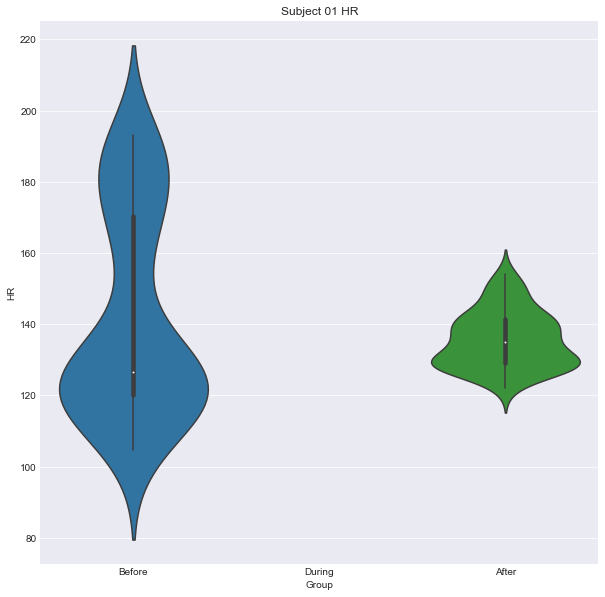

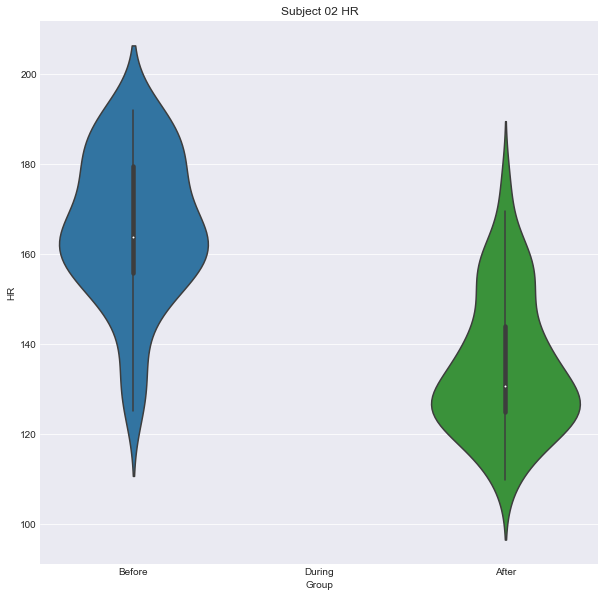

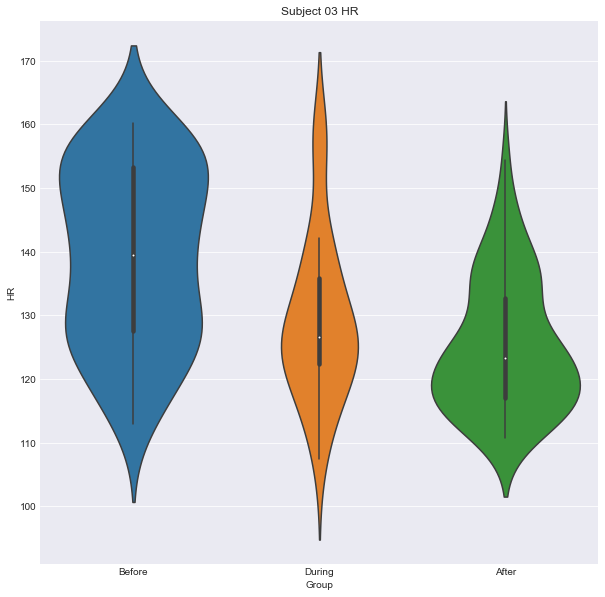

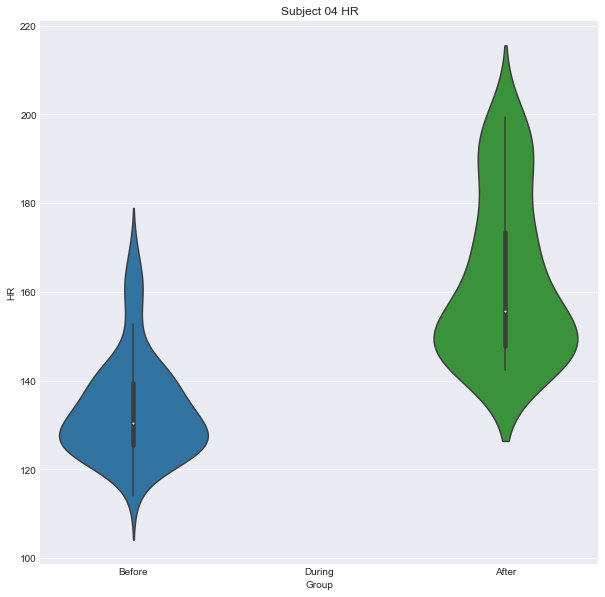

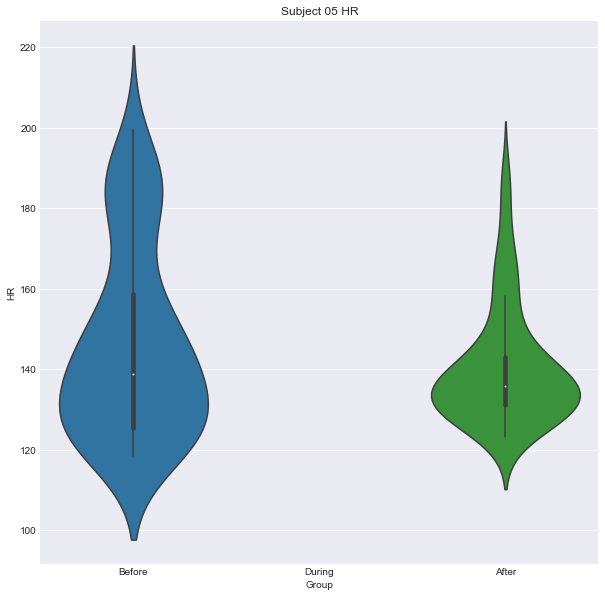

...

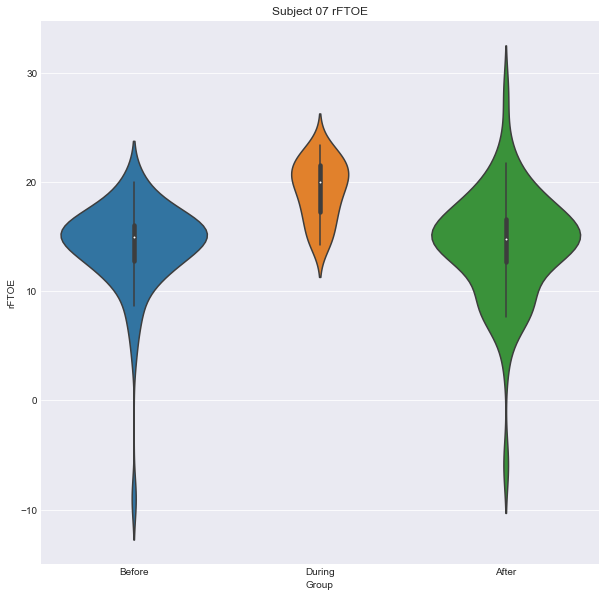

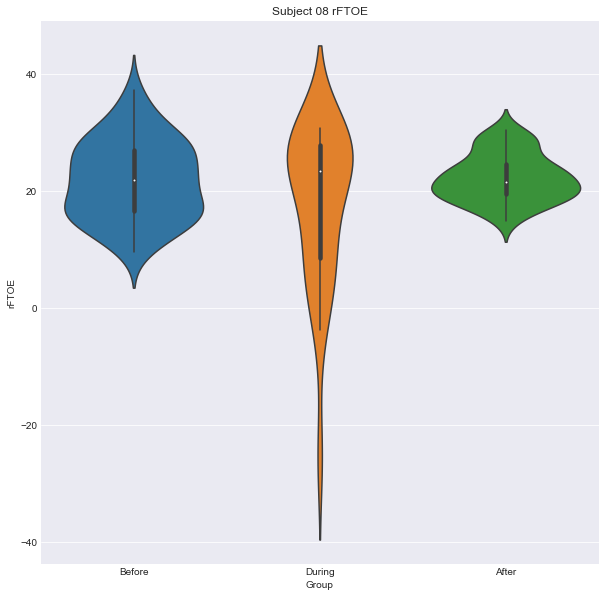

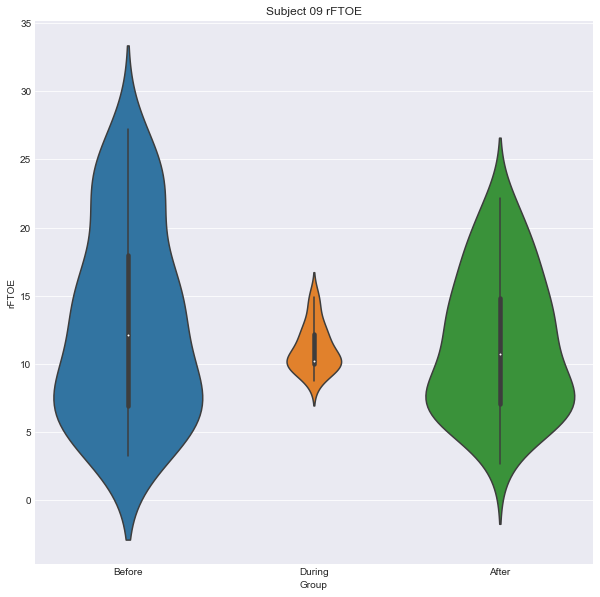

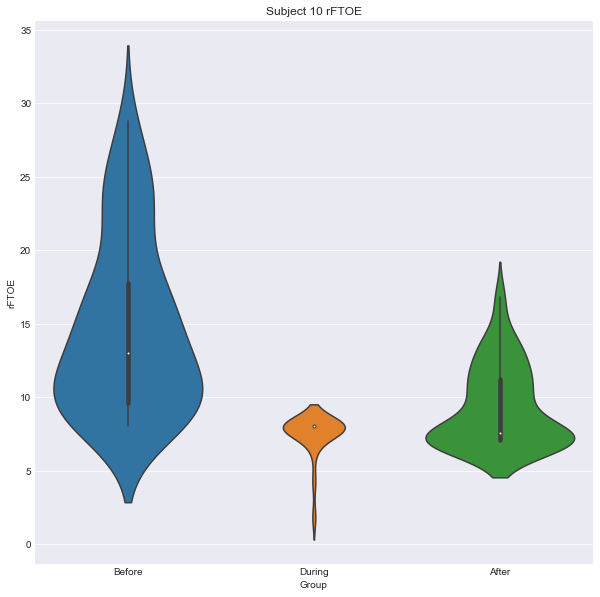

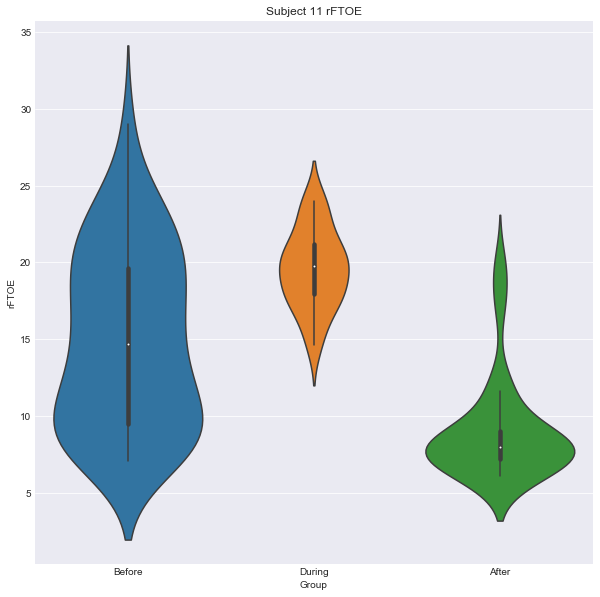

In [17]:
%matplotlib inline
plt.rcParams['figure.figsize'] = [10, 10]
plt.style.use('seaborn-darkgrid')

for var in varlst[1:-1]:
    for i in Subject_lst:
        sns.violinplot(x="Group", y=var, data=data.loc[data['Subject'] == i], order = ['Before', 'During', 'After'], scale='count', inner='box')
        plt.title('Subject '+ i + ' ' + var)
        plt.show()

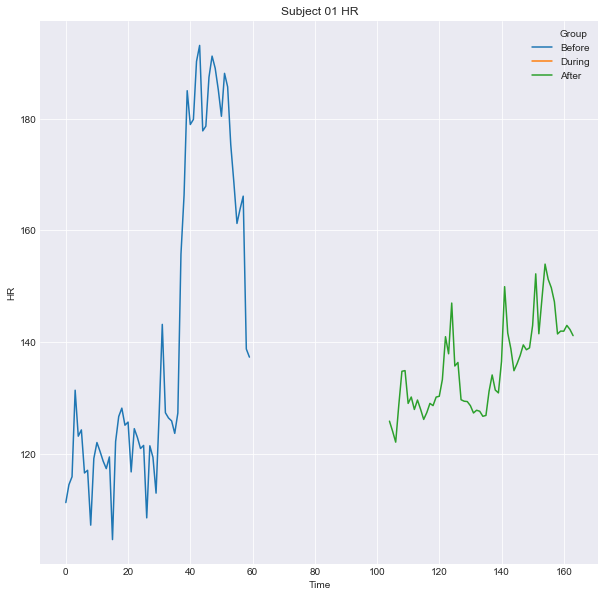

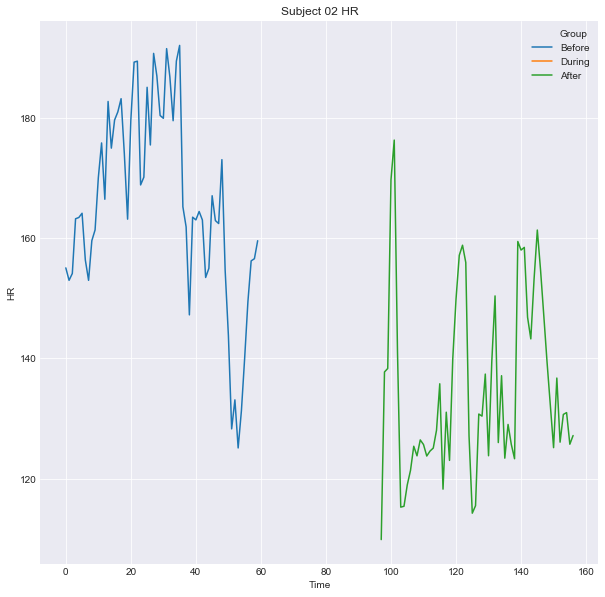

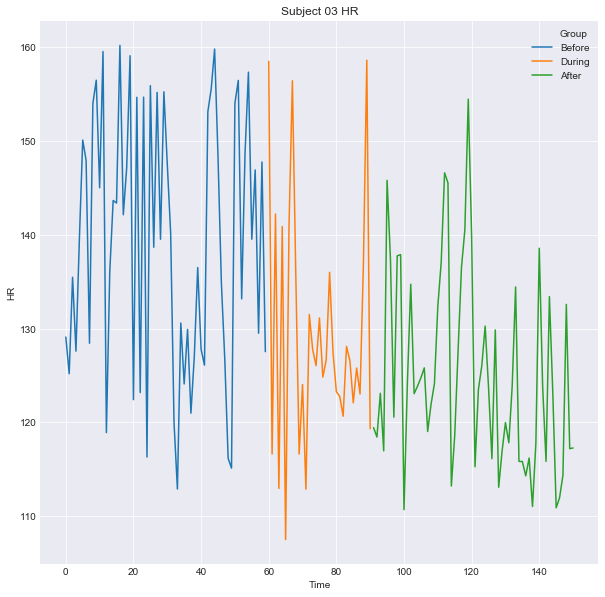

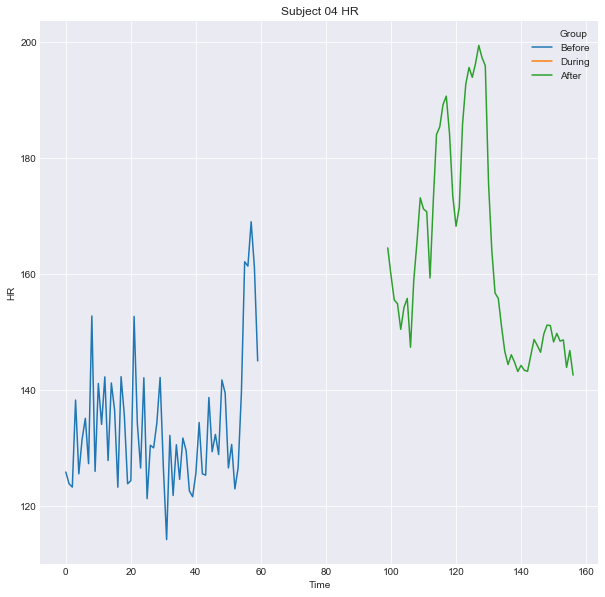

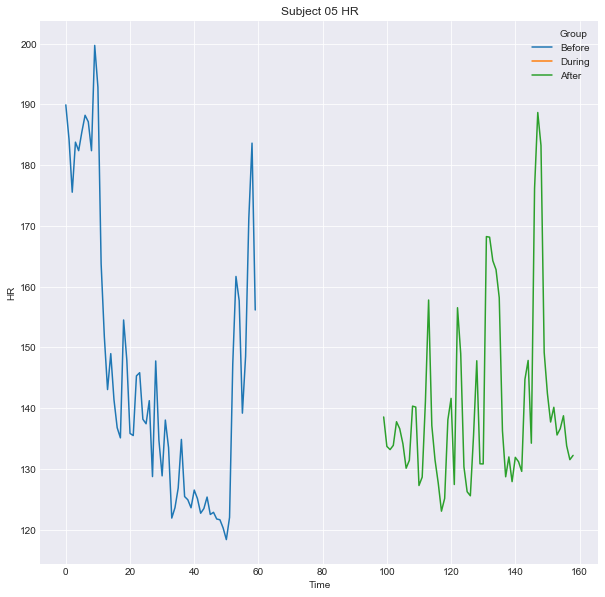

...

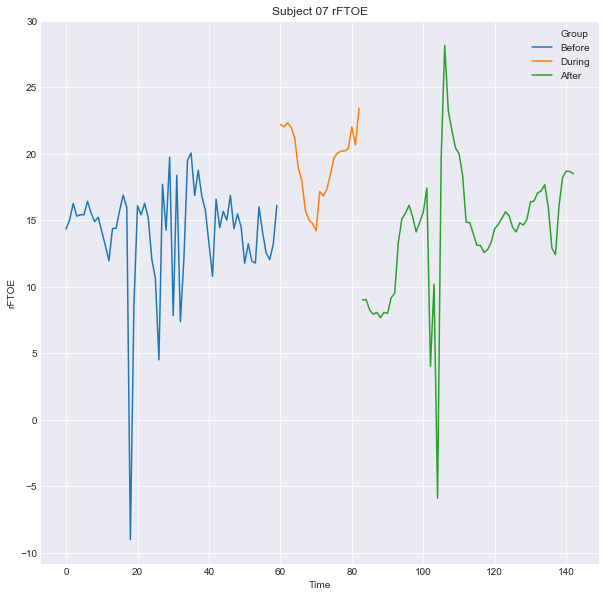

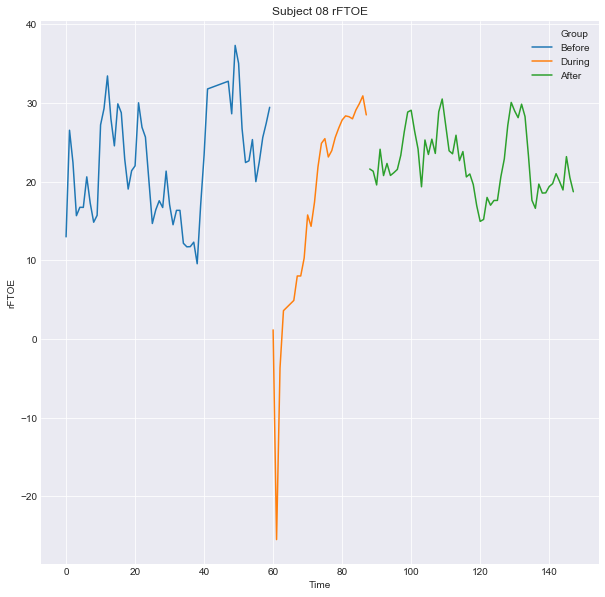

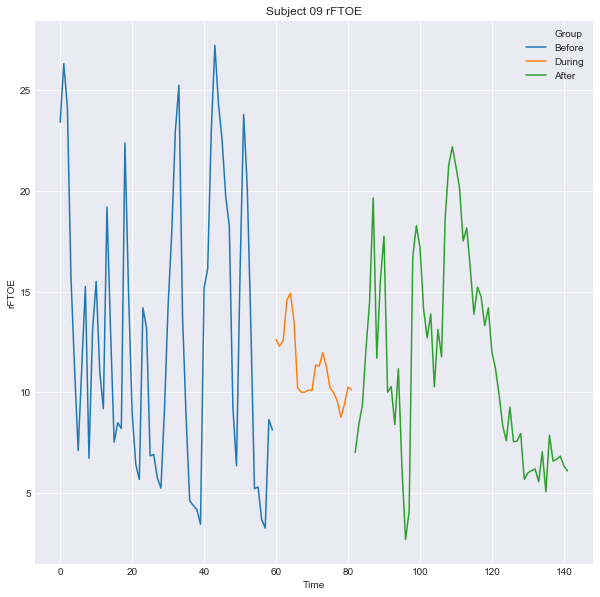

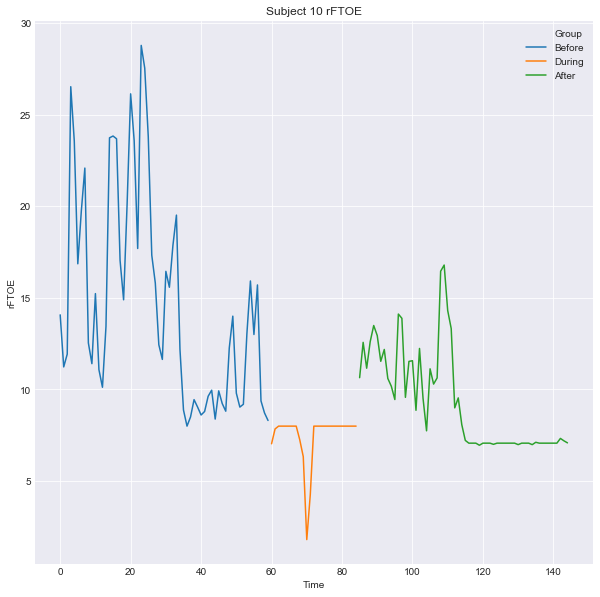

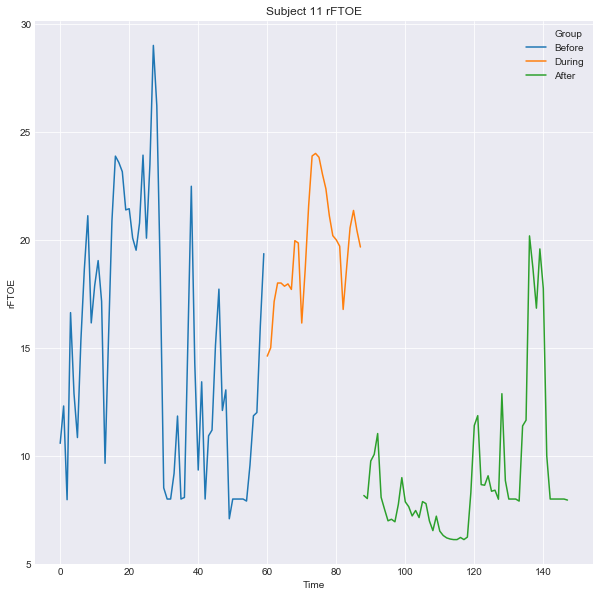

In [18]:
for var in varlst[1:-1]:
    for i in Subject_lst:
        sns.lineplot(x="Time", y=var, hue = 'Group', ci='sd', data=data.loc[data['Subject'] == i])
        plt.title('Subject '+ i + ' ' + var)
        plt.show()

### Outlier Removal
Due to the 1 minute averaged nature of the data, no calculation for auto-removal of outliers have been performed

The following data points were removed from the raw data as they are obvious artifacts:
    - GTP008 showed a very obvious SpO2 artifact of 7.4E-34 at 10:38.
    - GTP010 had multiple cStO2 artifacts of around ~10^-40 at 12:40, 12:52, and 12:53

## Correlations Before and After

In [19]:
display_sbs(dfb.groupby('Subject').corr(), dfa.groupby('Subject').corr())

C3-P3 
 C4-P4 
 HR 
 MAP 
 RR 
 SpO2 
 Time 
 cFTOE 
 cStO2 
 rFTOE 
 rStO2 
 ratioStO2 
 
 
 Subject 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 01 
 C3-P3 
 1.000000 
 0.386421 
 -0.432053 
 NaN 
 0.258210 
 0.566266 
 -0.351647 
 0.465666 
 0.295627 
 -0.124192 
 0.346906 
 0.325135 
 
 
 C4-P4 
 0.386421 
 1.000000 
 -0.475781 
 NaN 
 0.121413 
 0.170964 
 -0.459349 
 -0.028796 
 0.303054 
 -0.370188 
 0.392182 
 0.382678 
 
 
 HR 
 -0.432053 
 -0.475781 
 1.000000 
 NaN 
 -0.431102 
 -0.453957 
 0.776237 
 -0.036635 
 -0.640524 
 0.791428 
 -0.879492 
 -0.878523 
 
 
 MAP 
 NaN 
 NaN 
 NaN 
 NaN 
 NaN 
 NaN 
 NaN 
 NaN 
 NaN 
 NaN 
 NaN 
 NaN 
 
 
 RR 
 0.258210 
 0.121413 
 -0.431102 
 NaN 
 1.000000 
 0.332033 
 -0.388044 
 -0.013182 
 0.507422 
 -0.303777 
 0.407722 
 0.323929 
 
 
 SpO2 
 0.566266 
 0.170964 
 -0.453957 
 NaN 
 0.332033 
 1.000000 
 -0.280874 
 0.735005 
 0.558820 
 -0.099000 
 0.497177 
 0.424540 
 
 
 Time 
 -0.351647 
 -0.459349 
 0.776237 
 NaN 
 -0.388044 
 -0.280874 
 1.000000 
 0.053834 
 -0.505373 
 0.518355 
 -0.575242 
 -0.536054 
 
 
 cFTOE 
 0.465666 
 -0.028796 
 -0.036635 
 NaN 
 -0.013182 
 0.735005 
 0.053834 
 1.000000 
 -0.149103 
 0.405387 
 -0.050734 
 -0.006665 
 
 
 cStO2 
 0.295627 
 0.303054 
 -0.640524 
 NaN 
 0.507422 
 0.558820 
 -0.505373 
 -0.149103 
 1.000000 
 -0.654271 
 0.800087 
 0.641837 
 
 
 rFTOE 
 -0.124192 
 -0.370188 
 0.791428 
 NaN 
 -0.303777 
 -0.099000 
 0.518355 
 0.405387 
 -0.654271 
 1.000000 
 -0.912275 
 -0.916169 
 
 
 rStO2 
 0.346906 
 0.392182 
 -0.879492 
 NaN 
 0.407722 
 0.497177 
 -0.575242 
 -0.050734 
 0.800087 
 -0.912275 
 1.000000 
 0.973209 
 
 
 ratioStO2 
 0.325135 
 0.382678 
 -0.878523 
 NaN 
 0.323929 
 0.424540 
 -0.536054 
 -0.006665 
 0.641837 
 -0.916169 
 0.973209 
 1.000000 
 
 
 02 
 C3-P3 
 1.000000 
 -0.022686 
 0.331754 
 -0.219490 
 0.200246 
 0.156168 
 -0.610428 
 0.363160 
 -0.350976 
 0.482524 
 -0.458093 
 -0.358336 
 
 
 C4-P4 
 -0.022686 
 1.000000 
 -0.299515 
 -0.036127 
 0.331497 
 0.152588 
 0.364440 
 -0.132932 
 0.202778 
 -0.464766 
 0.481007 
 0.452422 
 
 
 HR 
 0.331754 
 -0.299515 
 1.000000 
 -0.104928 
 -0.065965 
 -0.245542 
 -0.371950 
 -0.176480 
 0.111528 
 0.655715 
 -0.681928 
 -0.813292 
 
 
 MAP 
 -0.219490 
 -0.036127 
 -0.104928 
 1.000000 
 -0.041586 
 -0.087831 
 0.153242 
 0.064617 
 -0.142875 
 -0.046522 
 0.034011 
 0.068965 
 
 
 RR 
 0.200246 
 0.331497 
 -0.065965 
 -0.041586 
 1.000000 
 0.194211 
 0.063691 
 -0.037395 
 0.109259 
 -0.014785 
 0.040452 
 -0.002942 
 
 
 SpO2 
 0.156168 
 0.152588 
 -0.245542 
 -0.087831 
 0.194211 
 1.000000 
 -0.036949 
 0.472174 
 -0.172309 
 -0.000402 
 0.130391 
 0.221198 
 
 
 Time 
 -0.610428 
 0.364440 
 -0.371950 
 0.153242 
 0.063691 
 -0.036949 
 1.000000 
 -0.667989 
 0.733284 
 -0.778669 
 0.767401 
 0.540459 
 
 
 cFTOE 
 0.363160 
 -0.132932 
 -0.176480 
 0.064617 
 -0.037395 
 0.472174 
 -0.667989 
 1.000000 
 -0.949625 
 0.439597 
 -0.374493 
 -0.004979 
 
 
 cStO2 
 -0.350976 
 0.202778 
 0.111528 
 -0.142875 
 0.109259 
 -0.172309 
 0.733284 
 -0.949625 
 1.000000 
 -0.490543 
 0.464012 
 0.083221 
 
 
 rFTOE 
 0.482524 
 -0.464766 
 0.655715 
 -0.046522 
 -0.014785 
 -0.000402 
 -0.778669 
 0.439597 
 -0.490543 
 1.000000 
 -0.991508 
 -0.900213 
 
 
 rStO2 
 -0.458093 
 0.481007 
 -0.681928 
 0.034011 
 0.040452 
 0.130391 
 0.767401 
 -0.374493 
 0.464012 
 -0.991508 
 1.000000 
 0.921265 
 
 
 ratioStO2 
 -0.358336 
 0.452422 
 -0.813292 
 0.068965 
 -0.002942 
 0.221198 
 0.540459 
 -0.004979 
 0.083221 
 -0.900213 
 0.921265 
 1.000000 
 
 
 03 
 C3-P3 
 1.000000 
 0.529085 
 -0.008879 
 NaN 
 -0.187419 
 0.136793 
 0.053168 
 0.005485 
 0.063890 
 0.034792 
 -0.015399 
 -0.031328 
 
 
 C4-P4 
 0.529085 
 1.000000 
 0.014354 
 NaN 
 -0.002888 
 0.097205 
 0.082433 
 0.088344 
 -0.037642 
 0.086794 
 -0.068921 
 -0.059351 
 
 
 HR 
 -0.008879 
 0.014354 
 1.000000 
 NaN 
 -0.229866 
 -0.486372 
 -0.050973 
 -0.367606 
 0.113421 
 0.30

In [20]:
print('All Subjects 1 Hour Before')
display(dfb.corr())

print('All Subjects During')
display(dfd.corr())

print('All Subjects 1 Hour After')
display(dfa.corr())

All Subjects 1 Hour Before


,HR,RR,SpO2,MAP,C3-P3,C4-P4,cStO2,rStO2,ratioStO2,cFTOE,rFTOE,Time
HR,1.000000,0.072958,-0.279750,0.024310,-0.164001,-0.407941,-0.152411,-0.630338,-0.298385,0.082475,0.553025,0.044176
RR,0.072958,1.000000,-0.039487,-0.120904,-0.025755,0.114387,-0.065001,0.005014,0.094326,0.066108,-0.022562,-0.051051
SpO2,-0.279750,-0.039487,1.000000,-0.144052,-0.036689,0.051470,0.379649,0.311003,-0.105400,-0.062206,0.029298,-0.006271
MAP,0.024310,-0.120904,-0.144052,1.000000,-0.081007,-0.257356,-0.014234,-0.318390,-0.332444,-0.078507,0.249690,-0.330521
C3-P3,-0.164001,-0.025755,-0.036689,-0.081007,1.000000,0.039479,0.071628,0.255996,0.085439,-0.101224,-0.257668,-0.009642
C4-P4,-0.407941,0.114387,0.051470,-0.257356,0.039479,1.000000,0.097268,0.338045,0.161370,-0.085815,-0.335065,0.019447
cStO2,-0.152411,-0.065001,0.379649,-0.014234,0.071628,0.097268,1.000000,0.045386,-0.720195,-0.946137,0.075038,-0.016984
rStO2,-0.630338,0.005014,0.311003,-0.318390,0.255996,0.338045,0.045386,1.000000,0.650644,0.039340,-0.940118,-0.040961
ratioStO2,-0.298385,0.094326,-0.105400,-0.332444,0.085439,0.161370,-0.720195,0.650644,1.000000,0.744156,-0.702310,-0.034265
cFTOE,0.082475,0.066108,-0.062206,-0.078507,-0.101224,-0.085815,-0.946137,0.039340,0.744156,1.000000,-0.059258,0.020871


All Subjects During


,HR,RR,SpO2,MAP,C3-P3,C4-P4,cStO2,rStO2,ratioStO2,cFTOE,rFTOE,Time
HR,1.000000,-0.174318,-0.536638,0.154078,0.009487,-0.194076,0.190743,-0.268298,-0.371398,-0.453301,0.177207,-0.095199
RR,-0.174318,1.000000,-0.210081,-0.344981,0.201925,-0.366649,0.111098,-0.199892,-0.259346,-0.212961,0.173269,-0.275582
SpO2,-0.536638,-0.210081,1.000000,0.359550,0.034926,-0.067560,-0.076639,-0.081450,-0.001941,0.313195,0.328554,0.118231
MAP,0.154078,-0.344981,0.359550,1.000000,0.167245,-0.121915,-0.259873,0.166602,0.285811,0.310469,0.000489,0.253691
C3-P3,0.009487,0.201925,0.034926,0.167245,1.000000,0.094547,-0.184454,0.027221,0.141217,0.175593,-0.020546,-0.062074
C4-P4,-0.194076,-0.366649,-0.067560,-0.121915,0.094547,1.000000,0.166560,-0.100610,-0.214700,-0.167772,0.082098,0.018528
cStO2,0.190743,0.111098,-0.076639,-0.259873,-0.184454,0.166560,1.000000,0.185742,-0.668711,-0.969786,-0.189415,-0.284695
rStO2,-0.268298,-0.199892,-0.081450,0.166602,0.027221,-0.100610,0.185742,1.000000,0.597748,-0.186154,-0.967263,-0.138805
ratioStO2,-0.371398,-0.259346,-0.001941,0.285811,0.141217,-0.214700,-0.668711,0.597748,1.000000,0.636070,-0.571558,0.121935
cFTOE,-0.453301,-0.212961,0.313195,0.310469,0.175593,-0.167772,-0.969786,-0.186154,0.636070,1.000000,0.260138,0.291006


All Subjects 1 Hour After


,HR,RR,SpO2,MAP,C3-P3,C4-P4,cStO2,rStO2,ratioStO2,cFTOE,rFTOE,Time
HR,1.000000,0.299467,-0.322202,-0.179785,-0.005880,-0.603079,-0.107376,-0.425127,-0.177268,-0.015025,0.257867,-0.243399
RR,0.299467,1.000000,-0.026464,-0.203860,0.066294,-0.143974,-0.024501,0.096819,0.087292,0.028538,-0.125876,0.063165
SpO2,-0.322202,-0.026464,1.000000,-0.308383,0.051486,0.230300,0.382723,0.499587,-0.018457,0.090106,0.106586,0.197704
MAP,-0.179785,-0.203860,-0.308383,1.000000,-0.276204,0.022169,-0.404265,-0.282119,0.158993,0.199705,0.108096,-0.003182
C3-P3,-0.005880,0.066294,0.051486,-0.276204,1.000000,0.057267,0.500898,0.168558,-0.333421,-0.507751,-0.153936,-0.097181
C4-P4,-0.603079,-0.143974,0.230300,0.022169,0.057267,1.000000,0.014953,0.355113,0.191768,0.078735,-0.249540,0.200301
cStO2,-0.107376,-0.024501,0.382723,-0.404265,0.500898,0.014953,1.000000,0.187507,-0.752349,-0.882517,0.029648,0.199001
rStO2,-0.425127,0.096819,0.499587,-0.282119,0.168558,0.355113,0.187507,1.000000,0.492322,0.033771,-0.805962,0.248565
ratioStO2,-0.177268,0.087292,-0.018457,0.158993,-0.333421,0.191768,-0.752349,0.492322,1.000000,0.800240,-0.562858,-0.021826
cFTOE,-0.015025,0.028538,0.090106,0.199705,-0.507751,0.078735,-0.882517,0.033771,0.800240,1.000000,0.029752,-0.117364


In [21]:
# Double Check 1 Hour After FTOE Values
dfa[['cFTOE', 'rFTOE']].describe()

,cFTOE,rFTOE
count,647.000000,644.000000
mean,21.136889,12.140463
std,8.321950,6.799743
min,-10.525395,-17.682342
25%,17.667651,7.185011
50%,21.235932,11.045116
75%,25.437623,16.668623
max,38.501679,30.913978


#### Between Subject comparisons - combined data 1 Hour Before, During, and 1 Hour After

#### Violin Plots and Time Series plots of all subjects Stratified by Group

Due to the variable nature of the length of "During", take the visualization of "During" with a grain of salt.

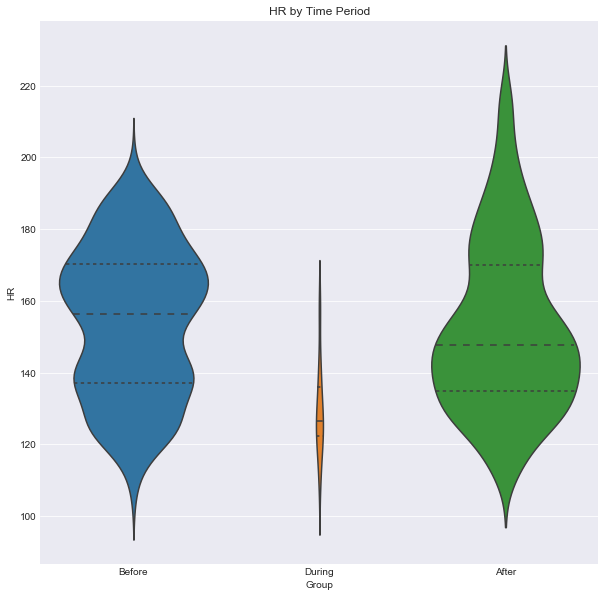

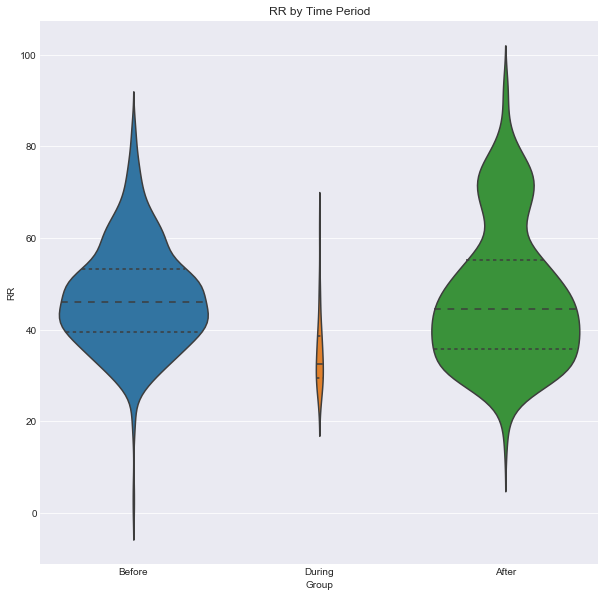

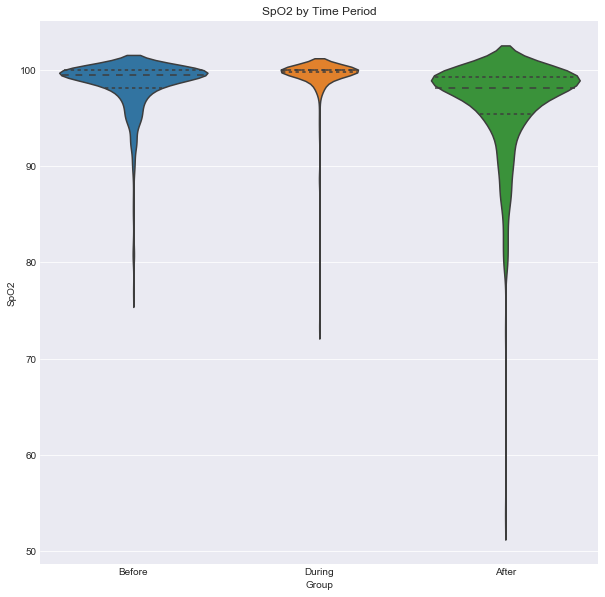

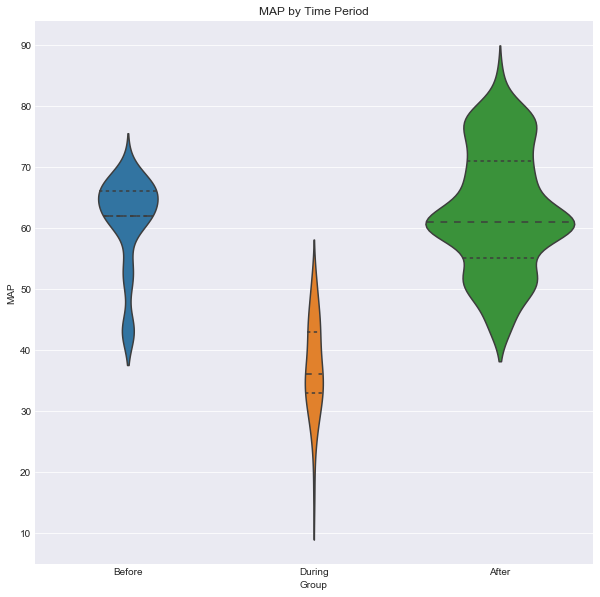

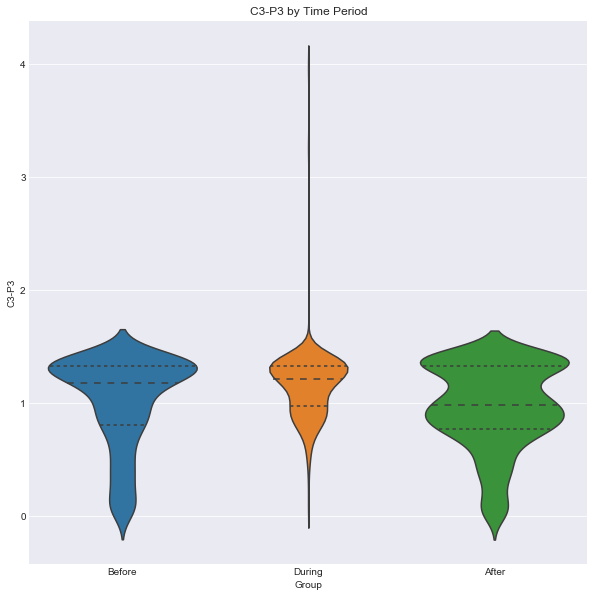

...

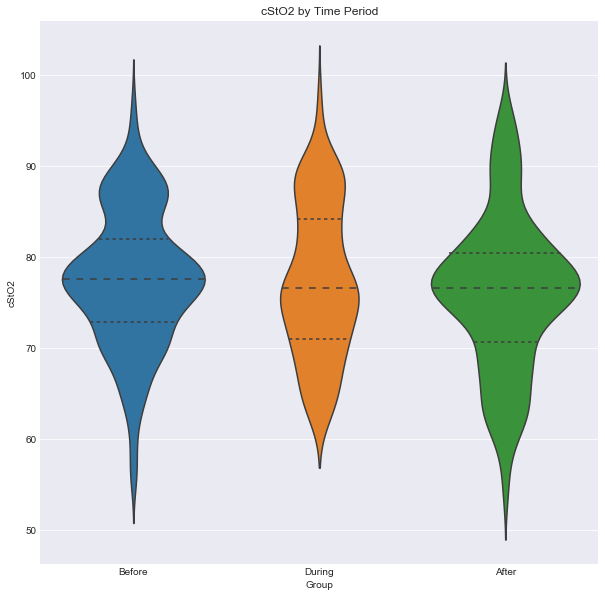

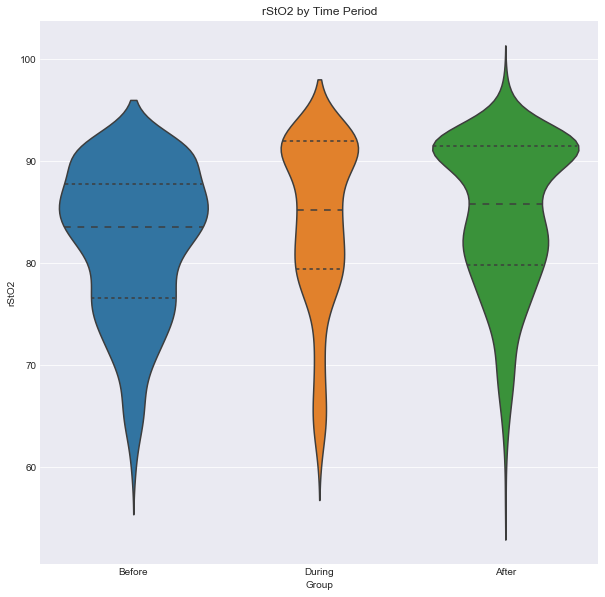

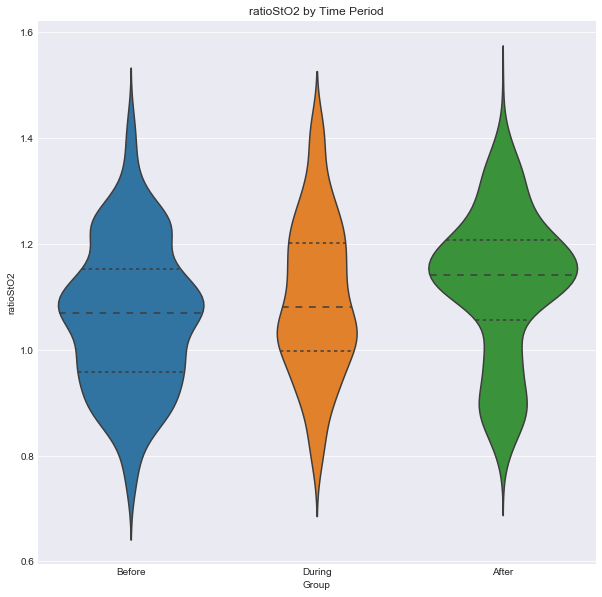

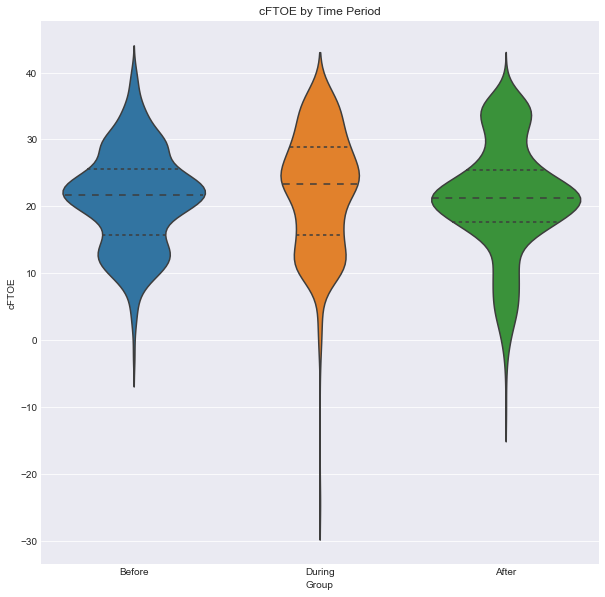

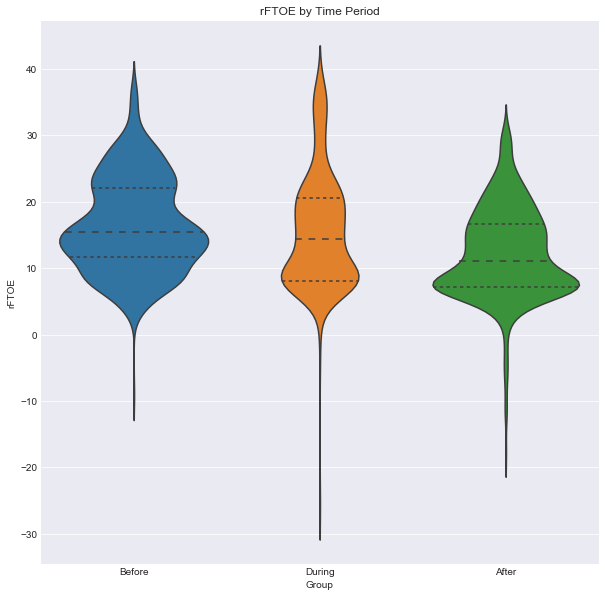

In [22]:
for var in varlst[1:-1]:
    ax = sns.violinplot(x ='Group', y=var, data=data, scale='count', inner='quartile')
    plt.title(var + ' by Time Period')
    plt.show()

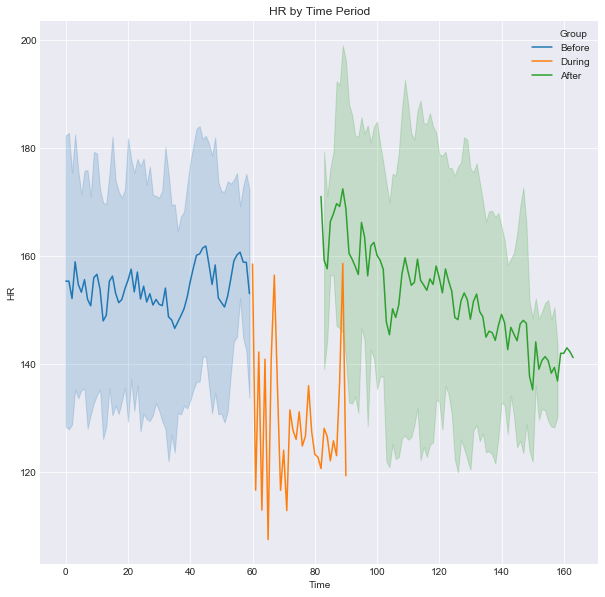

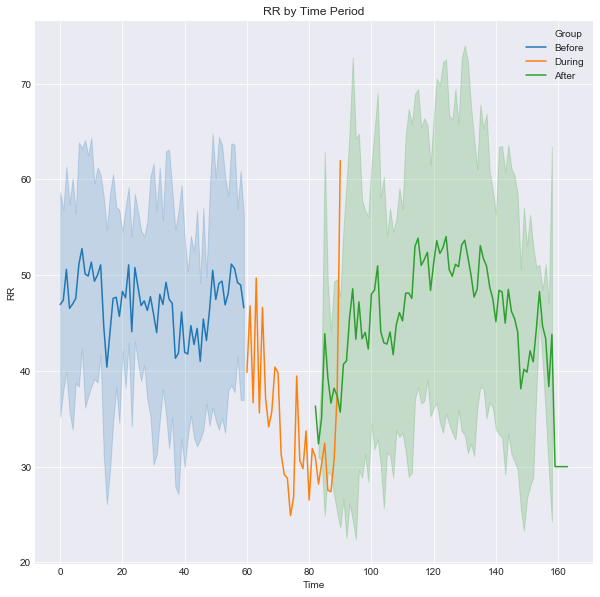

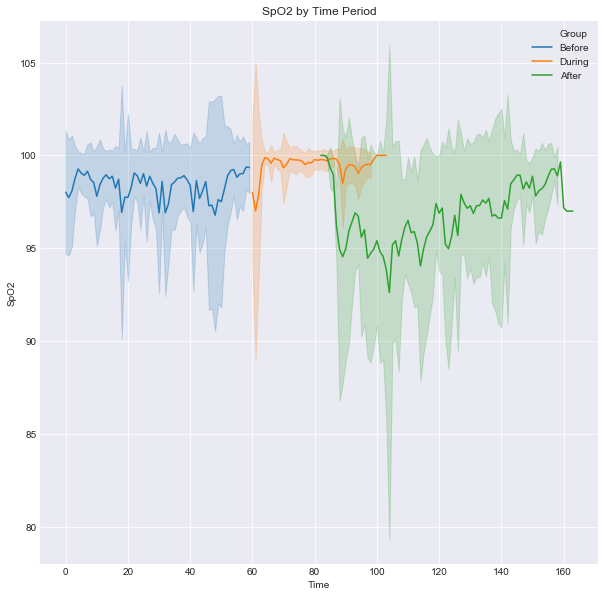

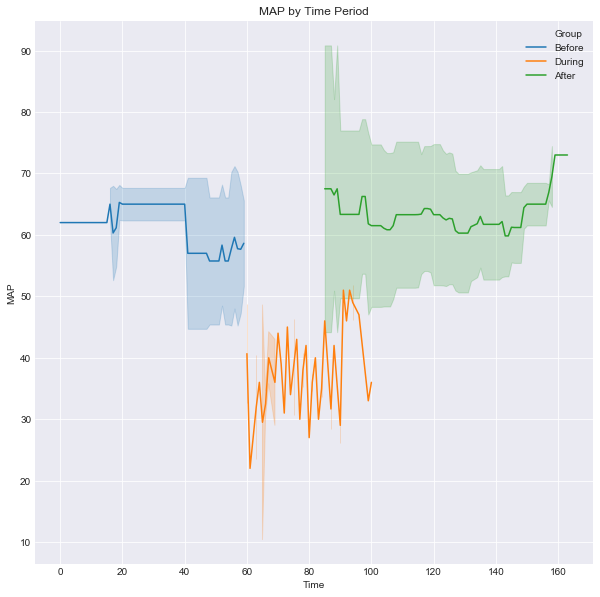

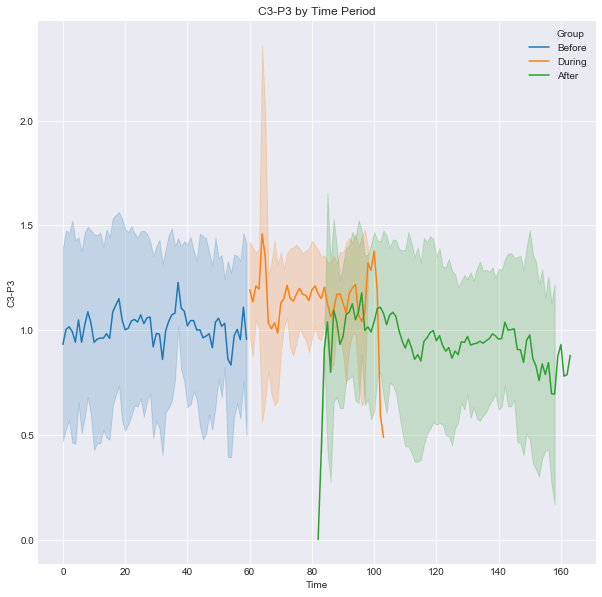

...

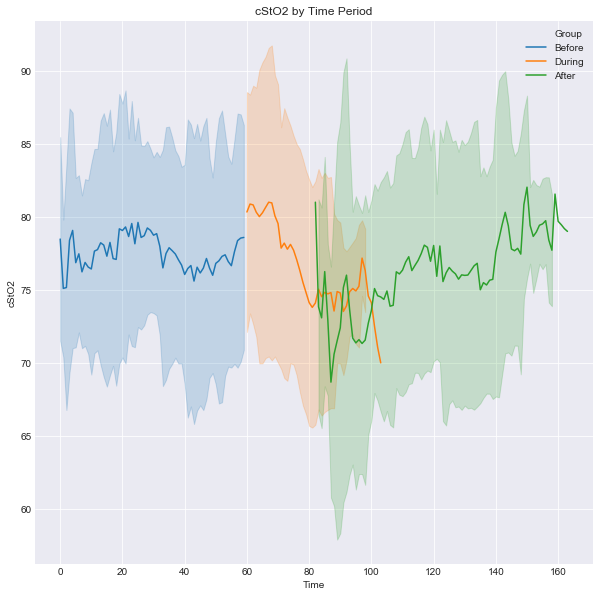

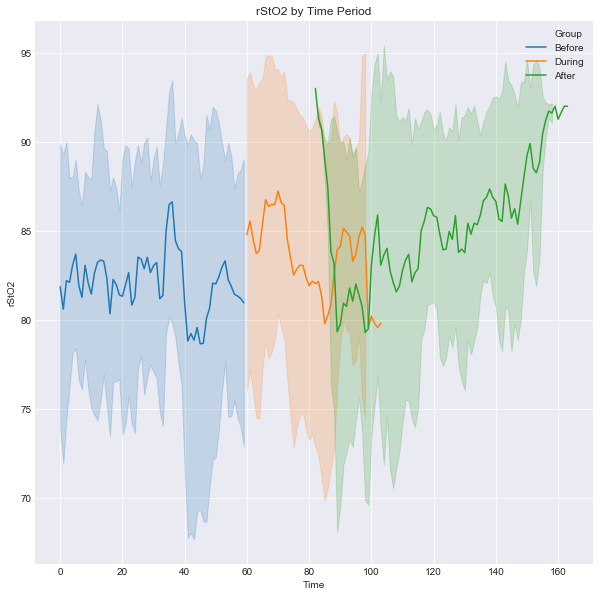

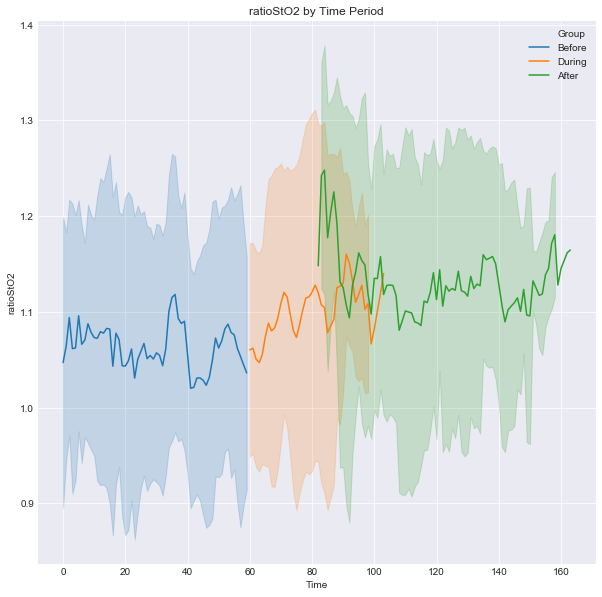

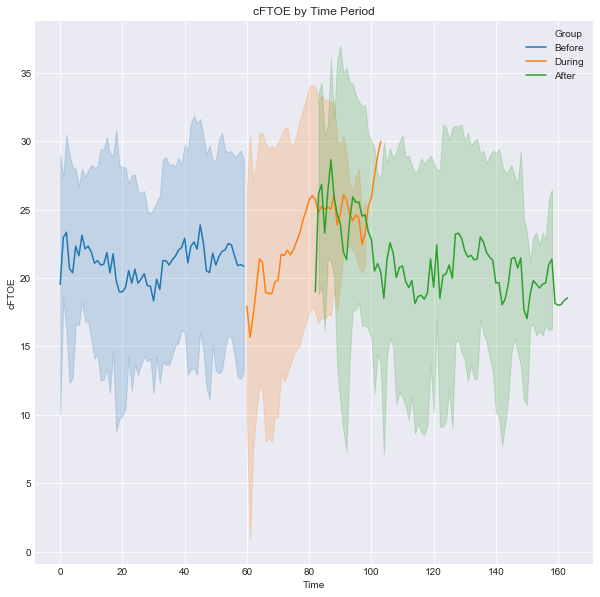

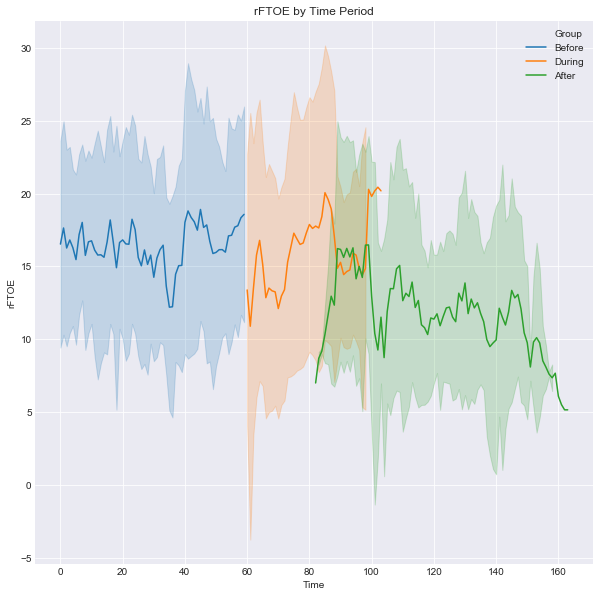

In [23]:
for var in varlst[1:-1]:
    sns.lineplot(x="Time", y=var, hue = 'Group', ci='sd', data=data)
    plt.title(var + ' by Time Period')
    plt.show()

## Conclusion

There may be temporal changes associated with HR, RR, and SpO2, though it remains to be seen whether these changes are clinically significant.